In [345]:
import pygmt
import os
import numpy as np
import xarray as xr
import pandas as pd
import matplotlib.pyplot as plt
import rasterio

from shapely.geometry import Point
from shapely.geometry import Polygon
import geopandas as gpd

from cmcrameri import cm
import ScientificColourMaps8 as SCM8

import csv


# Adapted for Kupferschiefer project data analysis


In [335]:
out_path = 'model7_NewSubK3_v2/'
if not os.path.exists(out_path):
    os.makedirs(out_path)
model_data = './export_Model7_NewSub3/' #NETCDFS of the simulations
basin_data = './model7_NewSubK3_v2/' # .csv files with positive basins updated
flow_data = './flowsed_model7/'

outfolder = 'result_export_Model7_TEST/'

if not os.path.exists(outfolder):
    os.makedirs(outfolder)


New CSV file 'model7_NewSubK3_v2/selected_positive_basins_sorted_0.csv' created.


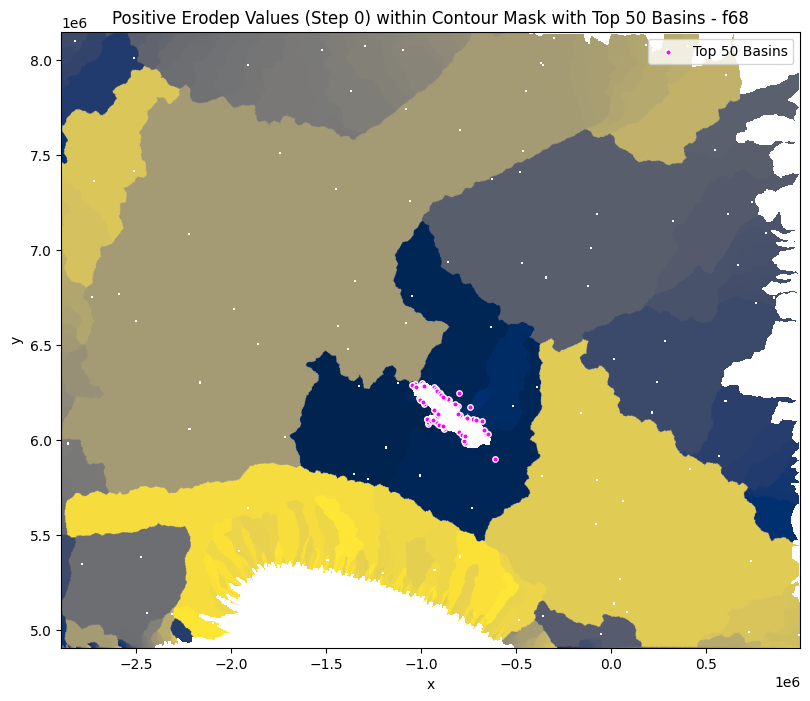

New CSV file 'model7_NewSubK3_v2/selected_positive_basins_sorted_1.csv' created.


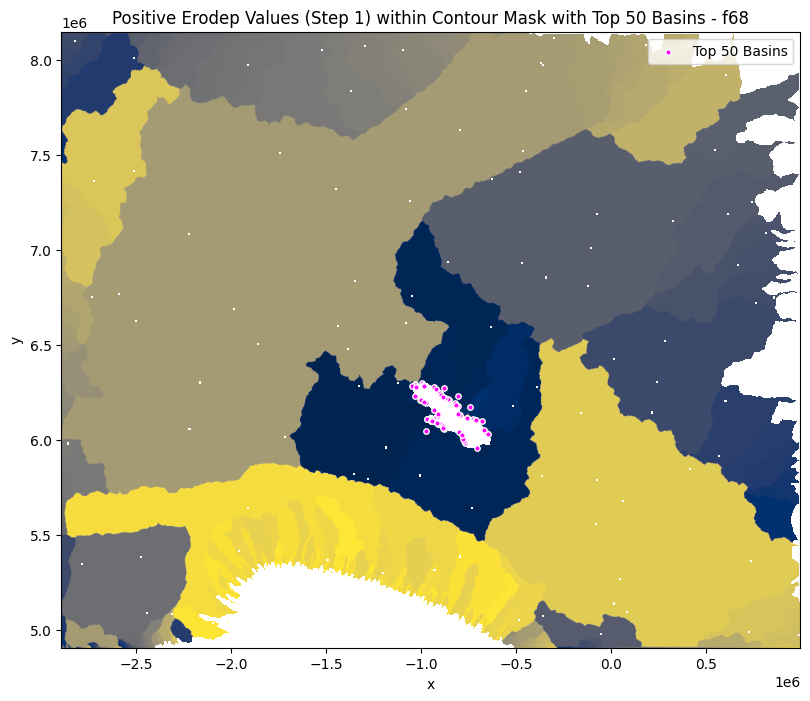

New CSV file 'model7_NewSubK3_v2/selected_positive_basins_sorted_2.csv' created.


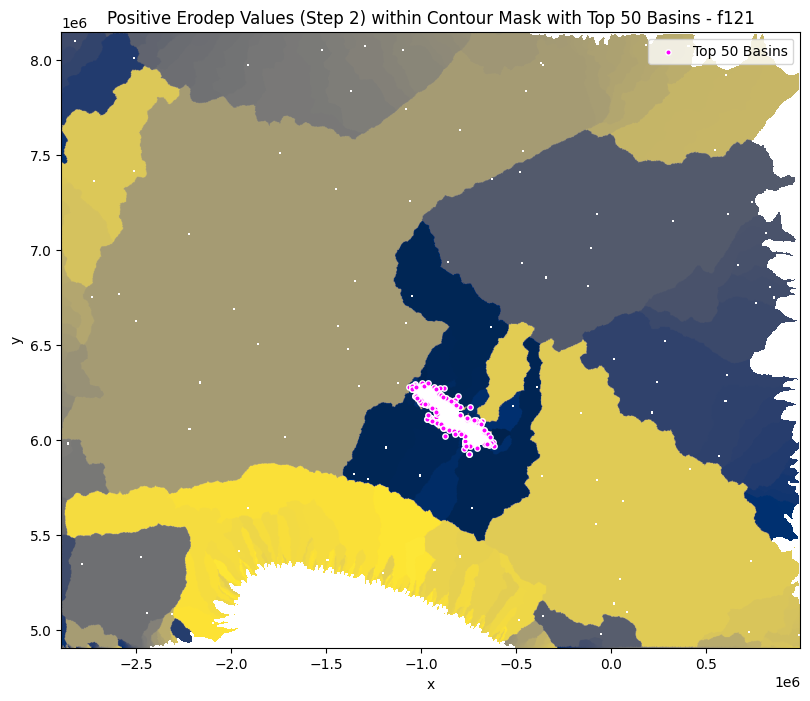

New CSV file 'model7_NewSubK3_v2/selected_positive_basins_sorted_3.csv' created.


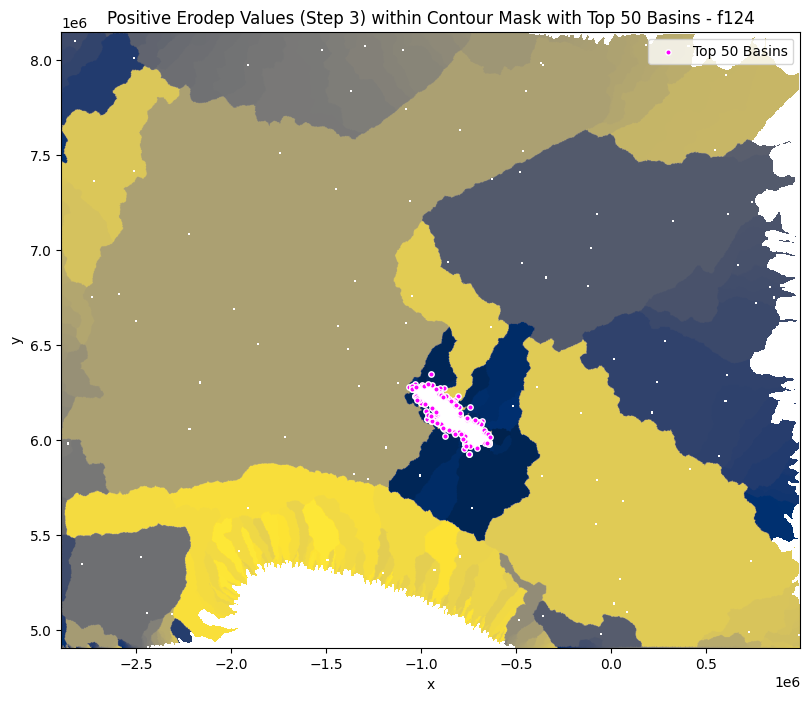

New CSV file 'model7_NewSubK3_v2/selected_positive_basins_sorted_4.csv' created.


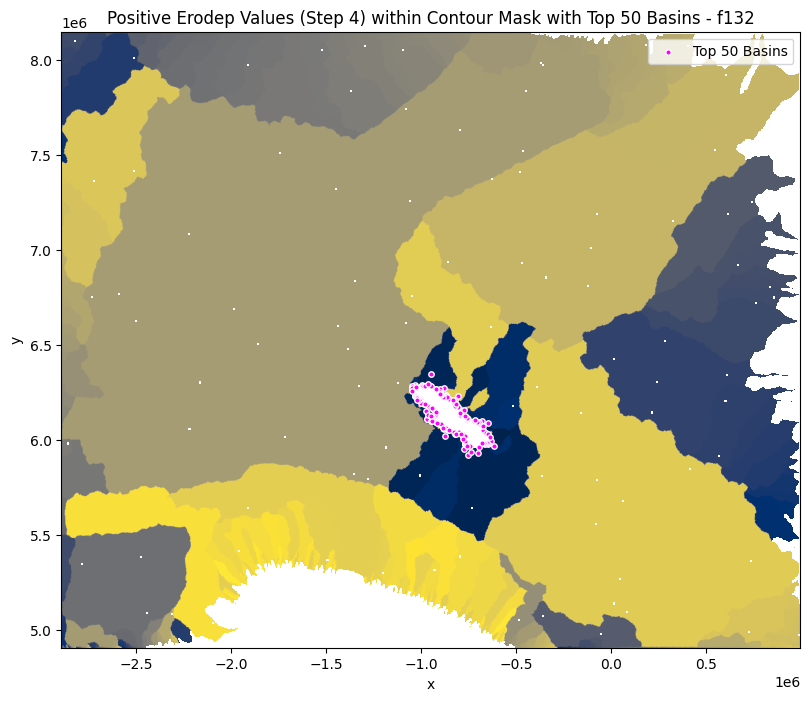

New CSV file 'model7_NewSubK3_v2/selected_positive_basins_sorted_5.csv' created.


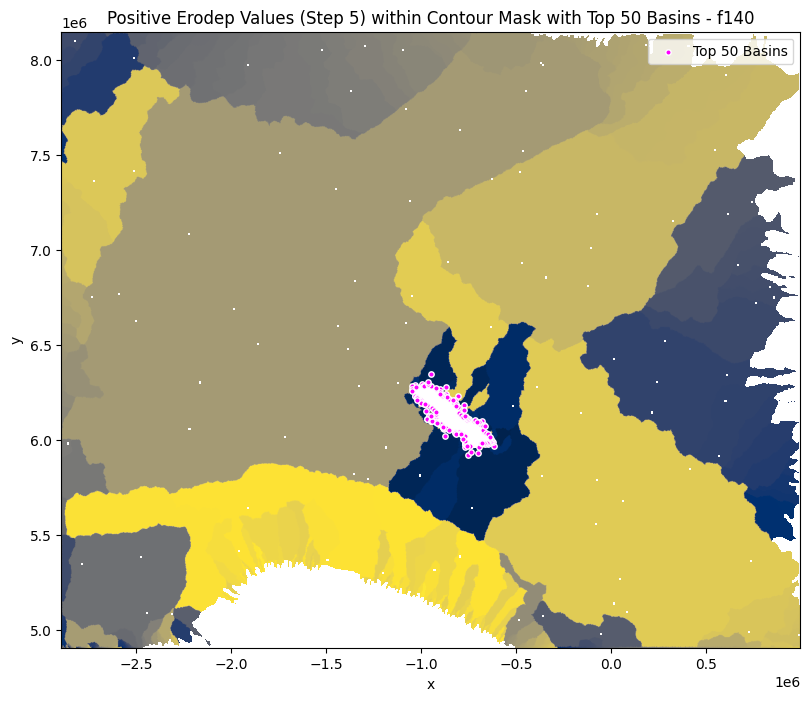

New CSV file 'model7_NewSubK3_v2/selected_positive_basins_sorted_6.csv' created.


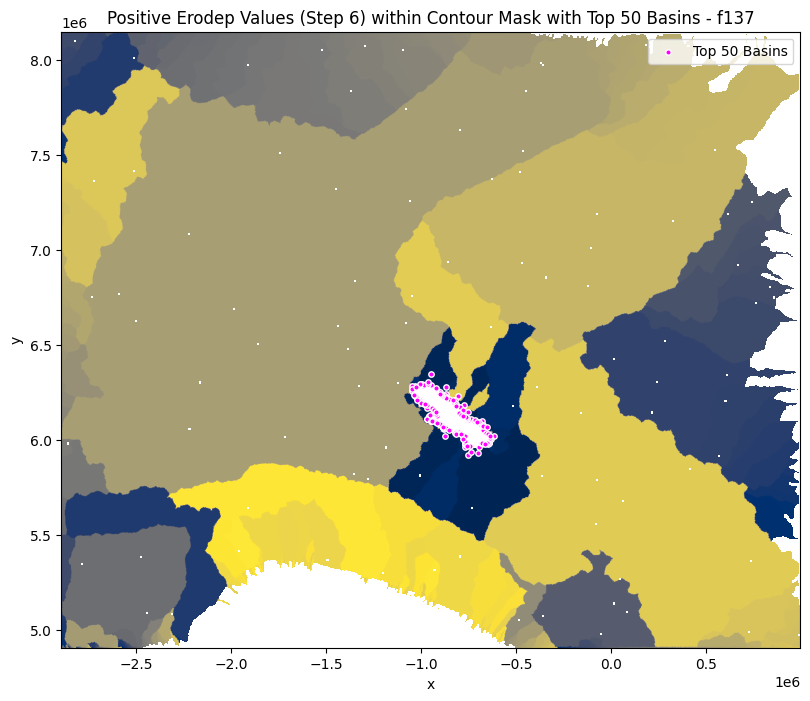

New CSV file 'model7_NewSubK3_v2/selected_positive_basins_sorted_7.csv' created.


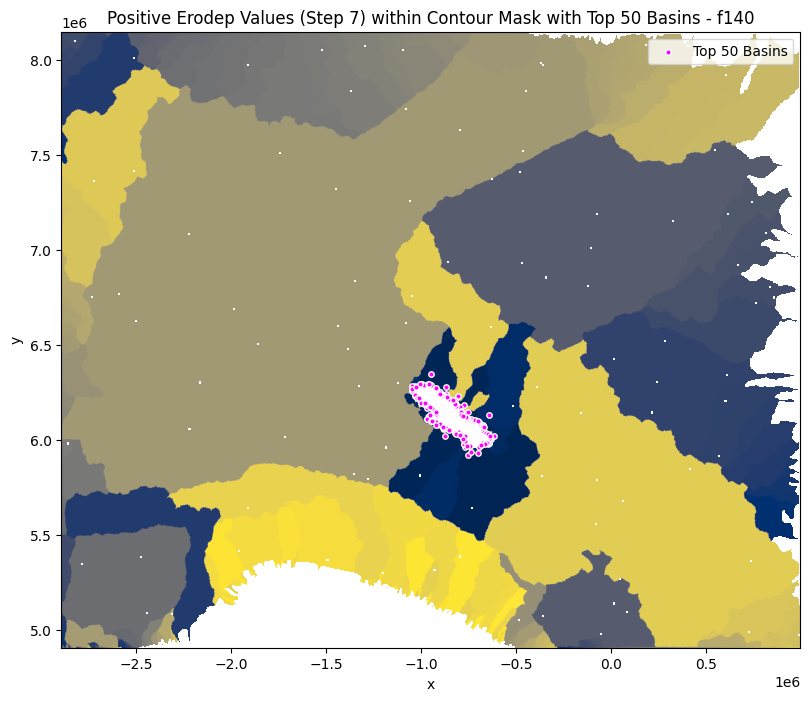

New CSV file 'model7_NewSubK3_v2/selected_positive_basins_sorted_8.csv' created.


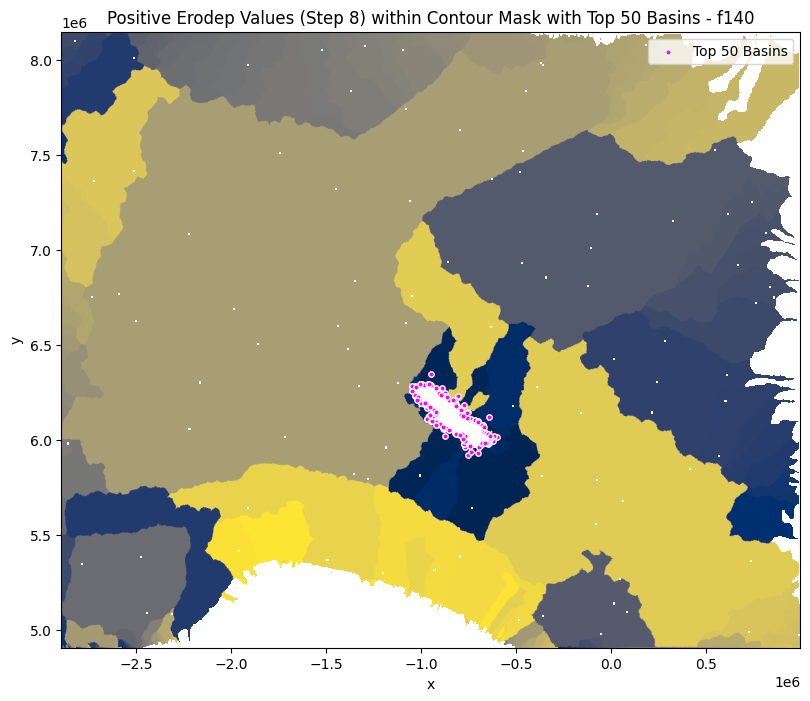

New CSV file 'model7_NewSubK3_v2/selected_positive_basins_sorted_9.csv' created.


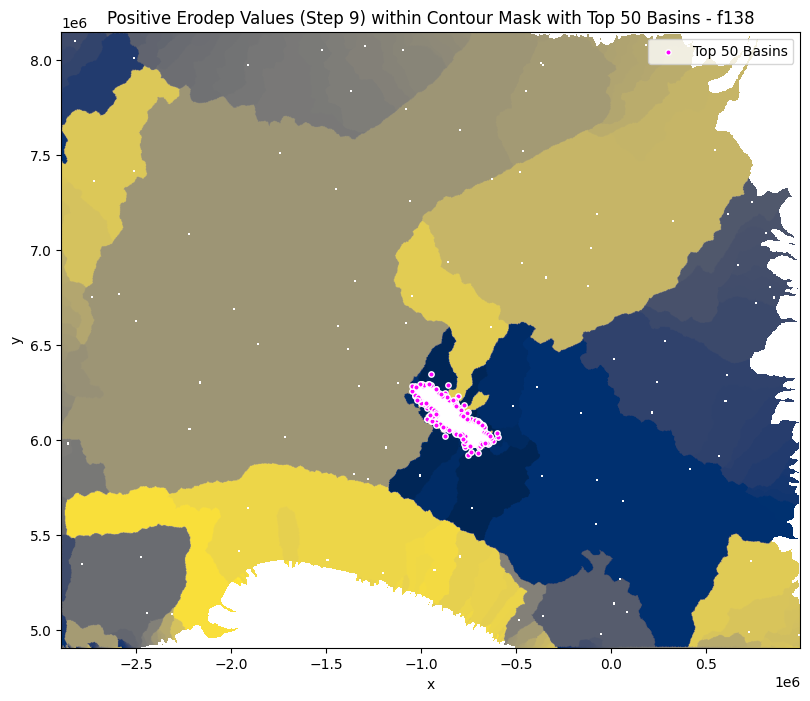

New CSV file 'model7_NewSubK3_v2/selected_positive_basins_sorted_10.csv' created.


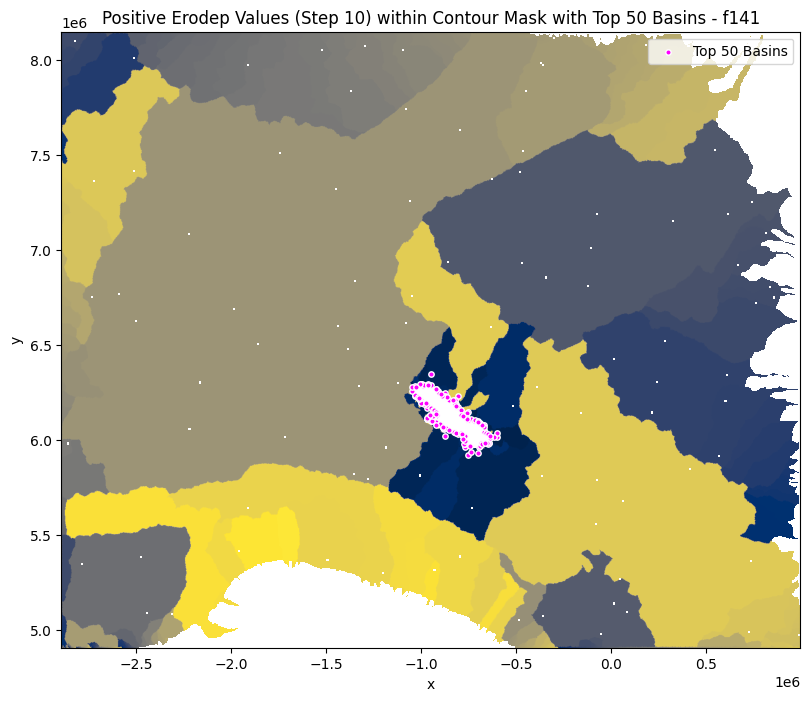

New CSV file 'model7_NewSubK3_v2/selected_positive_basins_sorted_11.csv' created.


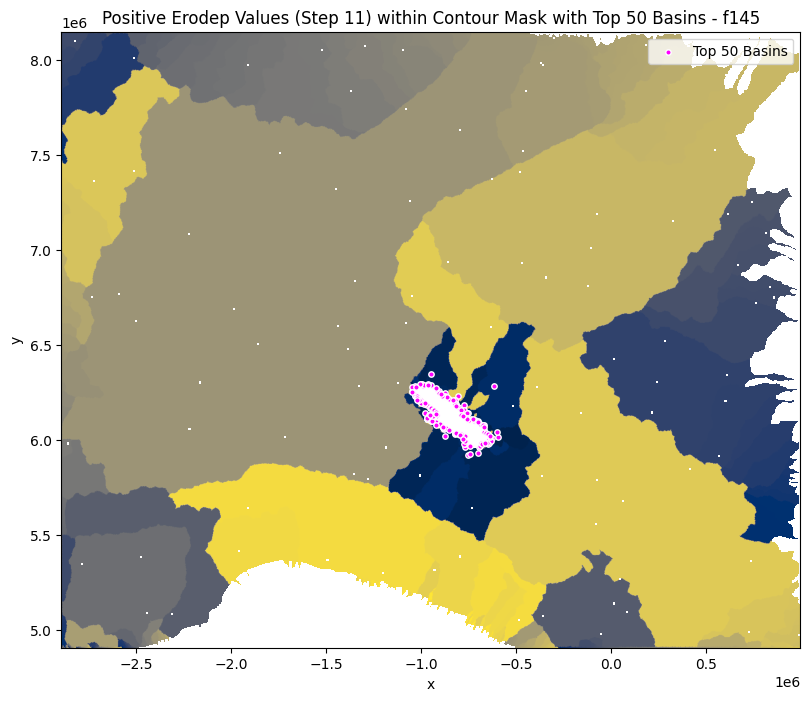

New CSV file 'model7_NewSubK3_v2/selected_positive_basins_sorted_12.csv' created.


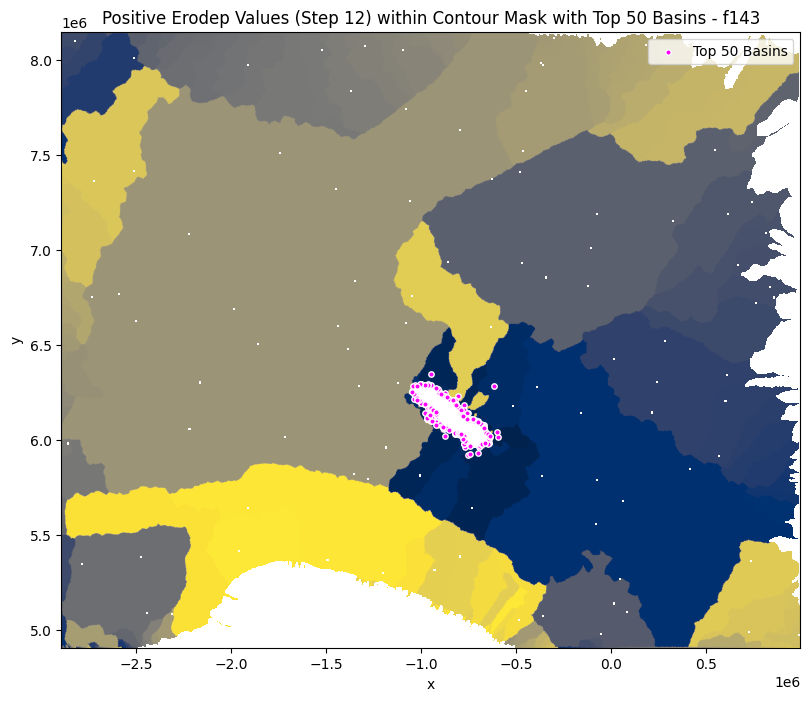

New CSV file 'model7_NewSubK3_v2/selected_positive_basins_sorted_13.csv' created.


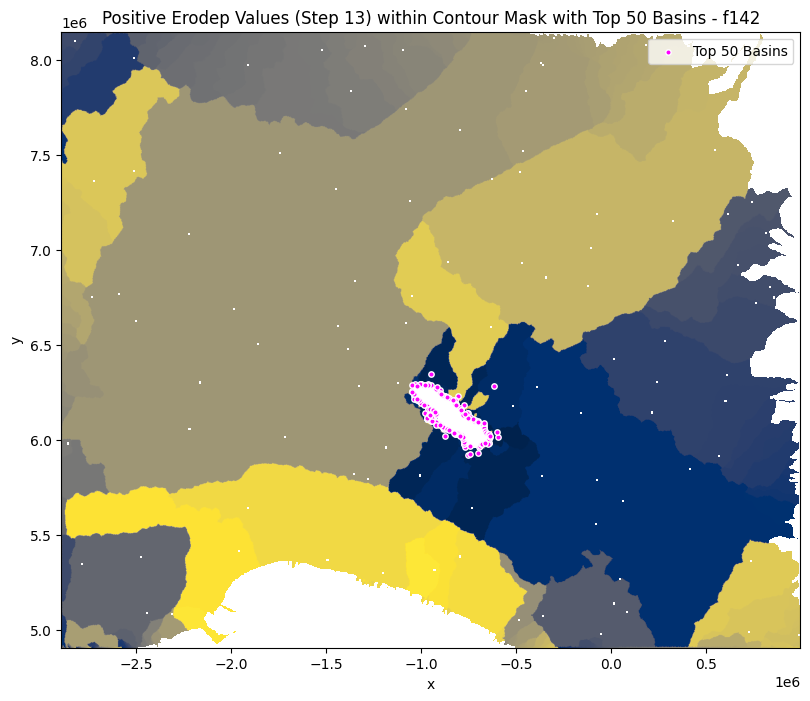

New CSV file 'model7_NewSubK3_v2/selected_positive_basins_sorted_14.csv' created.


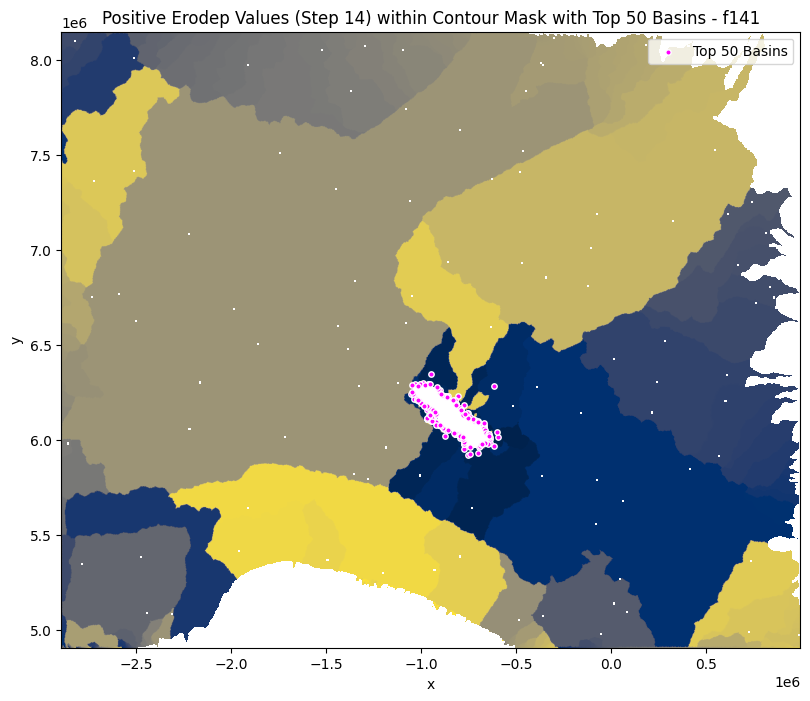

New CSV file 'model7_NewSubK3_v2/selected_positive_basins_sorted_15.csv' created.


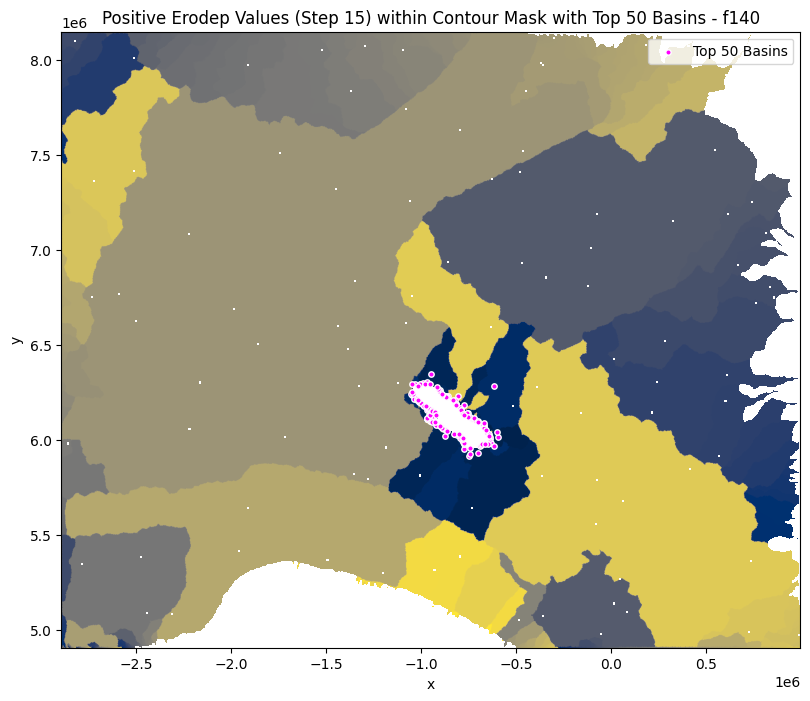

New CSV file 'model7_NewSubK3_v2/selected_positive_basins_sorted_16.csv' created.


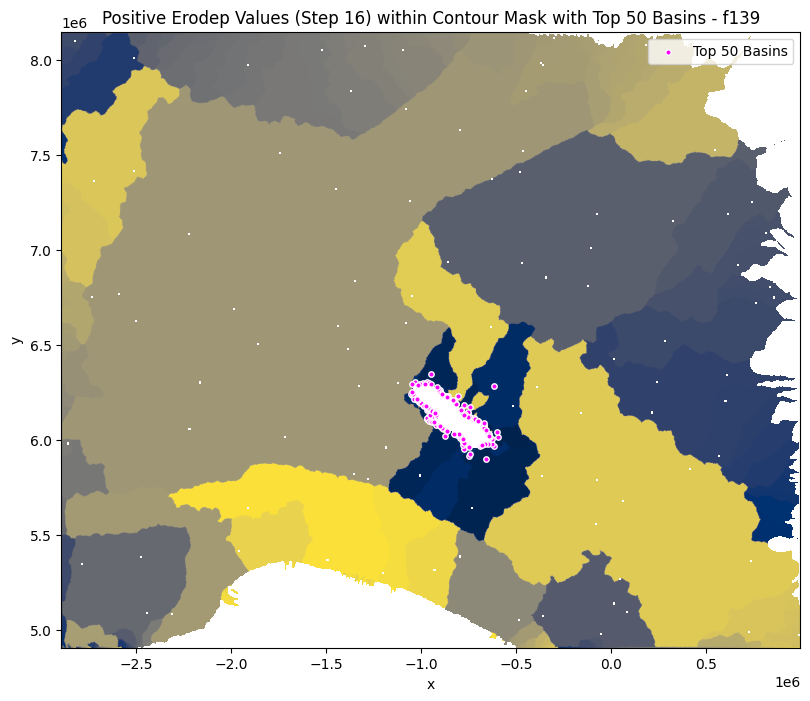

New CSV file 'model7_NewSubK3_v2/selected_positive_basins_sorted_17.csv' created.


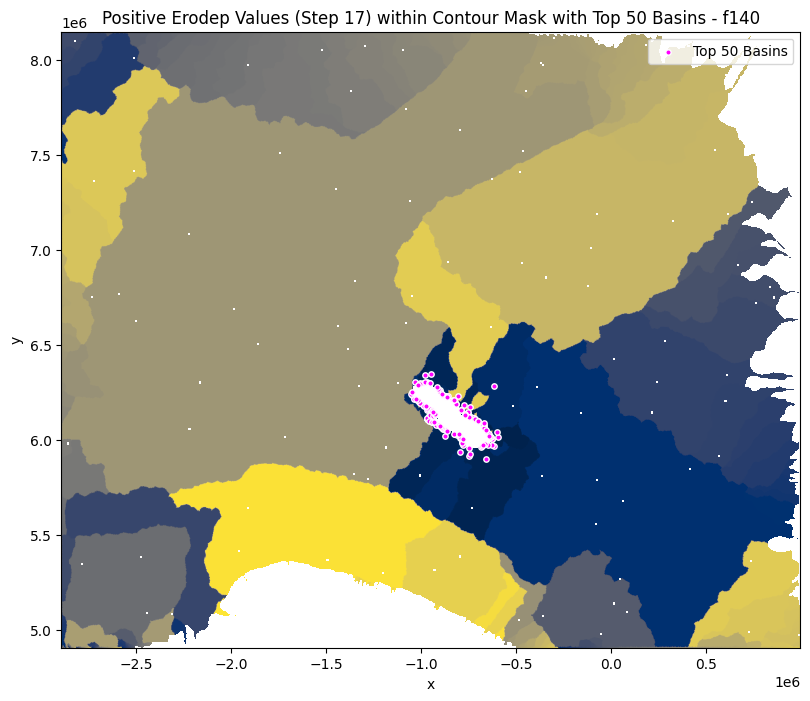

New CSV file 'model7_NewSubK3_v2/selected_positive_basins_sorted_18.csv' created.


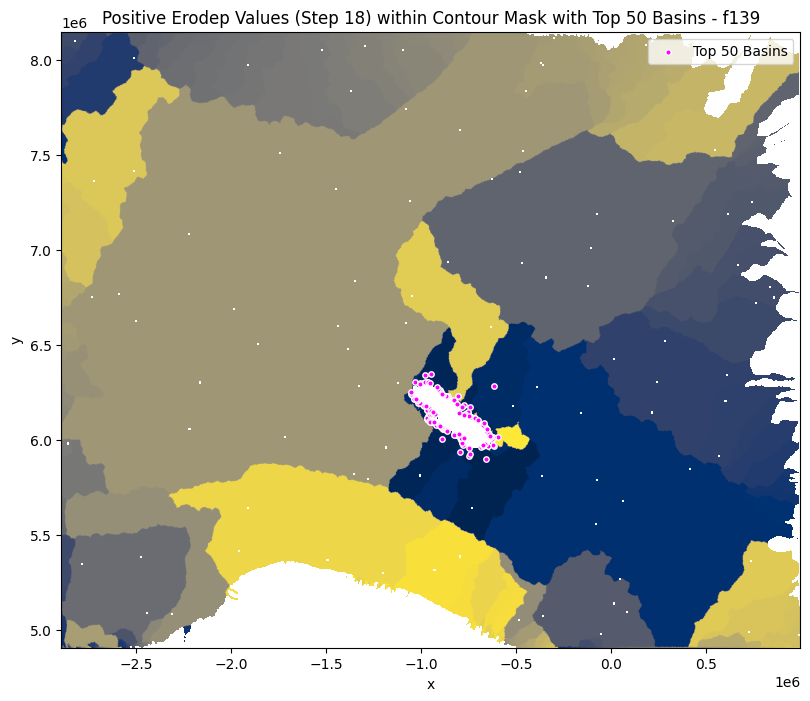

New CSV file 'model7_NewSubK3_v2/selected_positive_basins_sorted_19.csv' created.


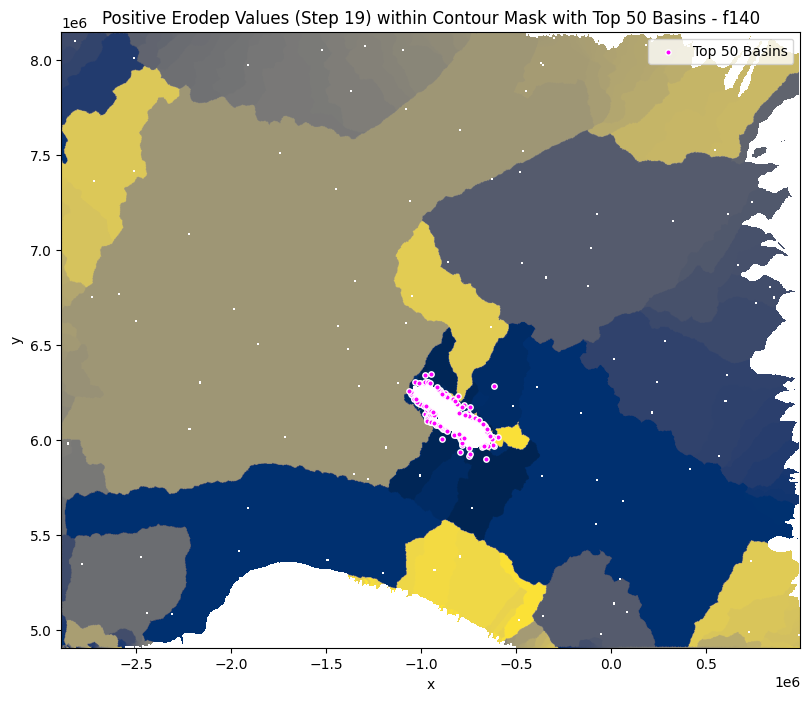

New CSV file 'model7_NewSubK3_v2/selected_positive_basins_sorted_20.csv' created.


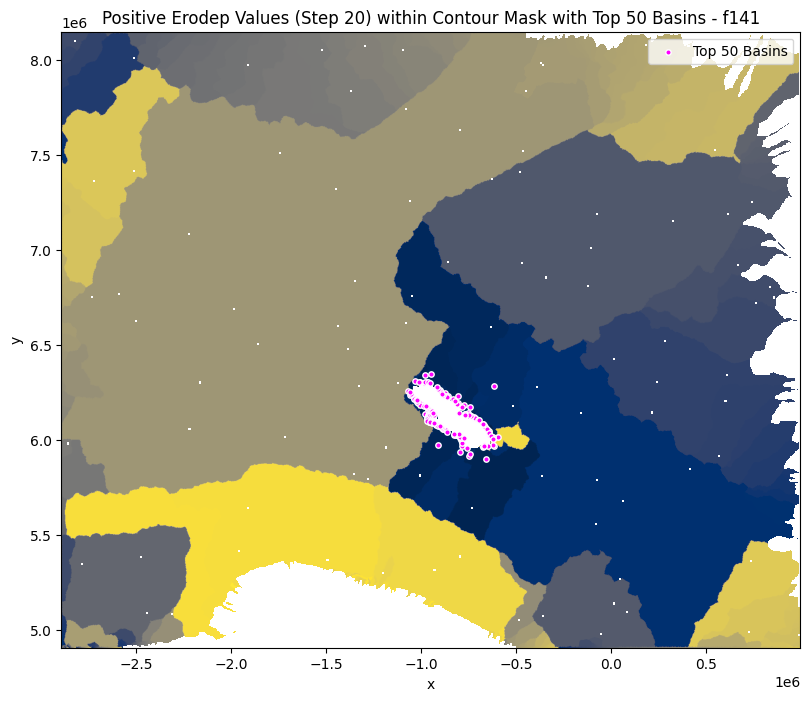

New CSV file 'model7_NewSubK3_v2/selected_positive_basins_sorted_21.csv' created.


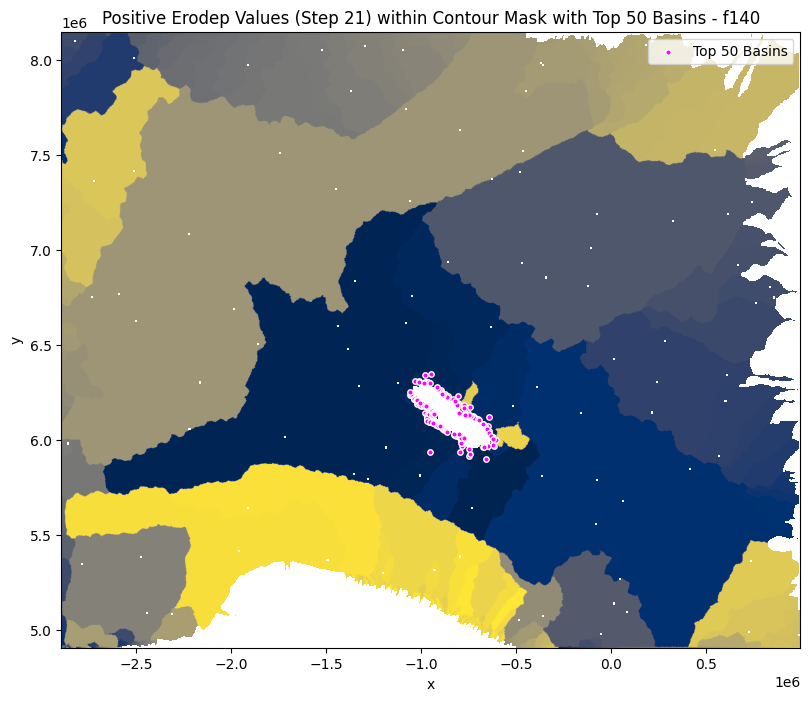

New CSV file 'model7_NewSubK3_v2/selected_positive_basins_sorted_22.csv' created.


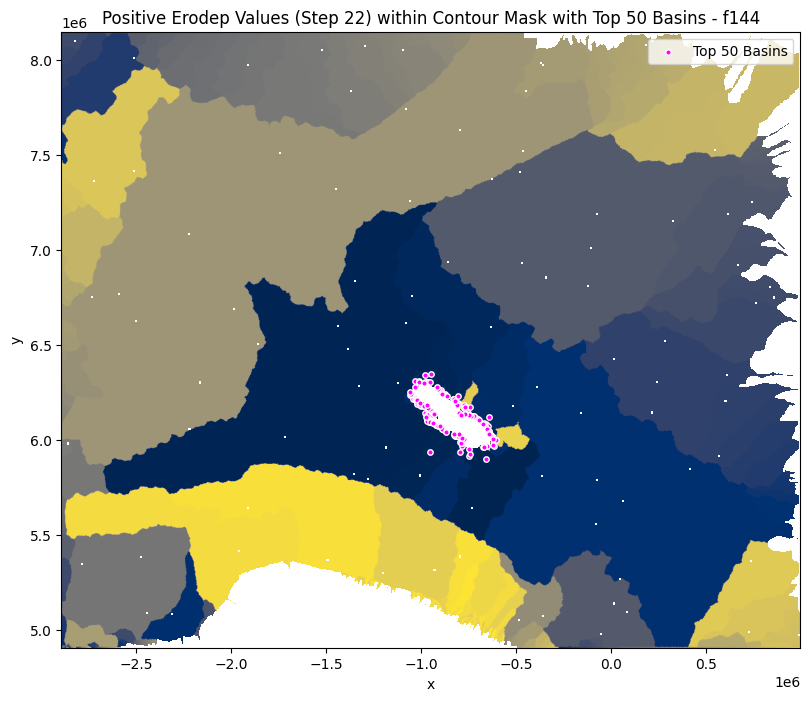

New CSV file 'model7_NewSubK3_v2/selected_positive_basins_sorted_23.csv' created.


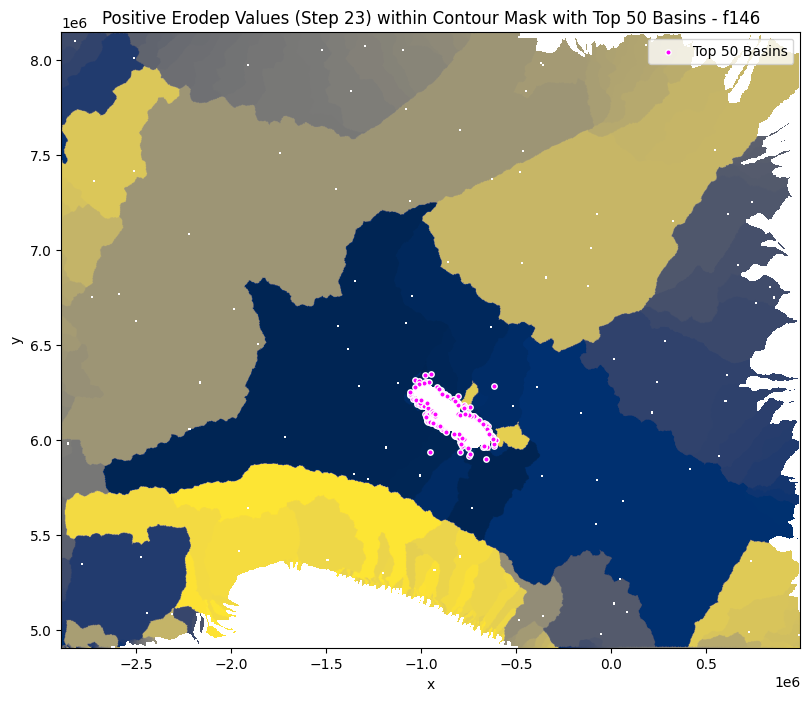

New CSV file 'model7_NewSubK3_v2/selected_positive_basins_sorted_24.csv' created.


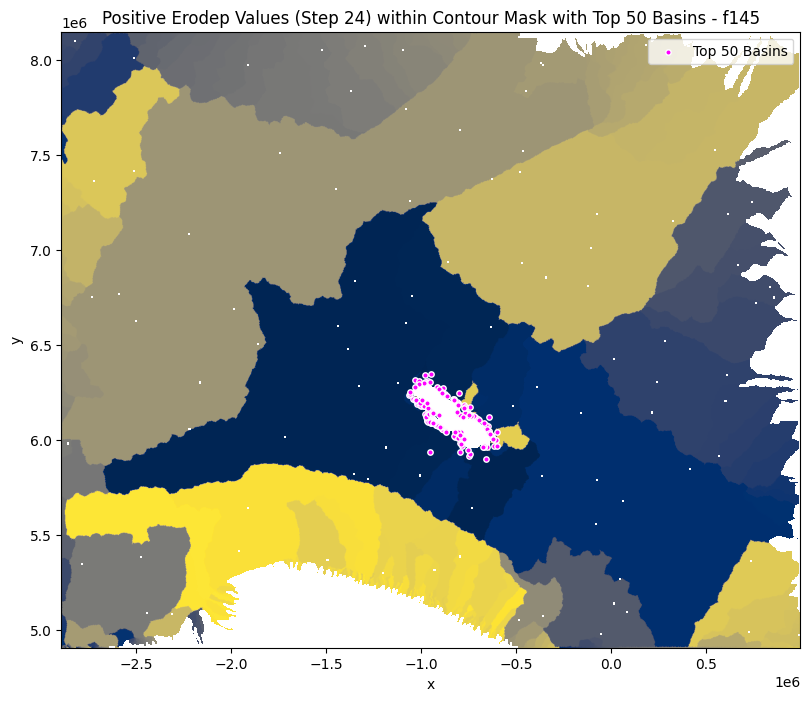

New CSV file 'model7_NewSubK3_v2/selected_positive_basins_sorted_25.csv' created.


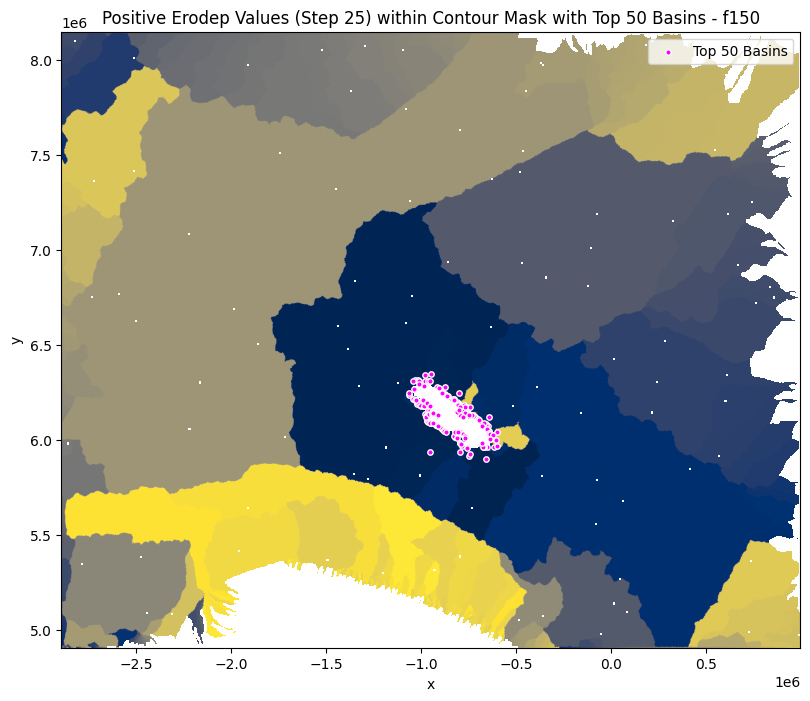

New CSV file 'model7_NewSubK3_v2/selected_positive_basins_sorted_26.csv' created.


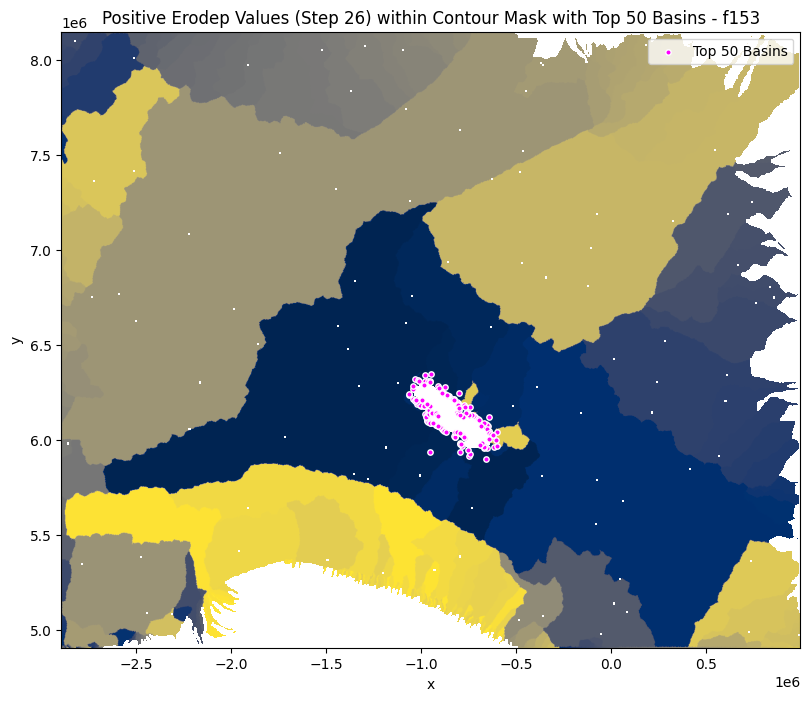

New CSV file 'model7_NewSubK3_v2/selected_positive_basins_sorted_27.csv' created.


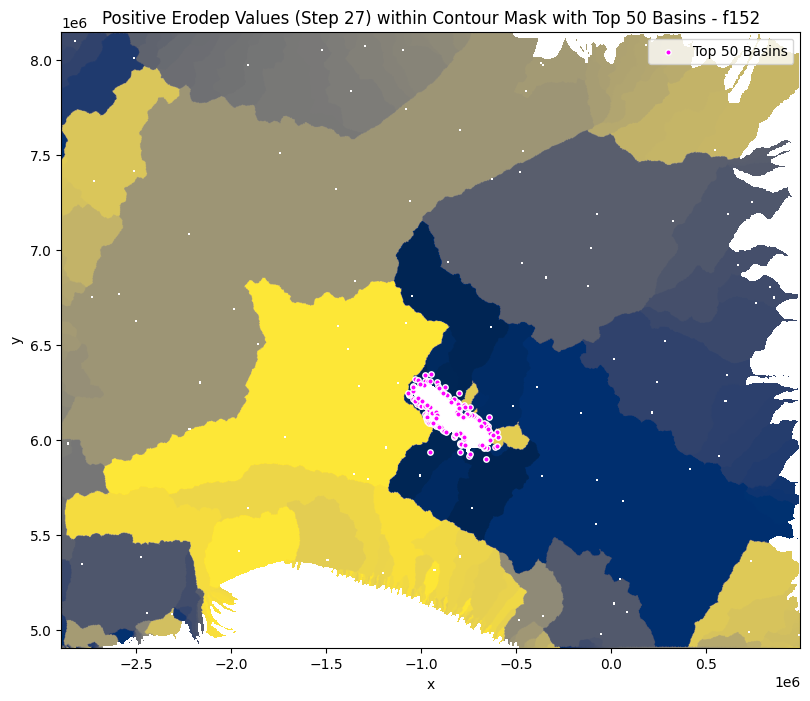

New CSV file 'model7_NewSubK3_v2/selected_positive_basins_sorted_28.csv' created.


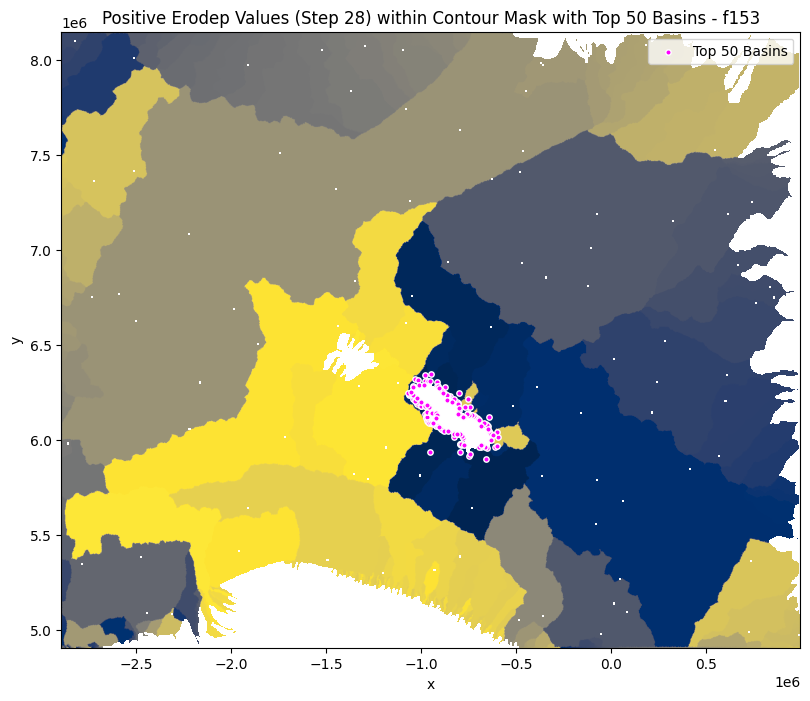

In [326]:
contour_threshold = 1
min_x, max_x = -1100000.0, -400000
min_y, max_y = 5800000.0, 6600000.0


# min_x, max_x = -2000000.0, -300000
# min_y, max_y = 5500000.0, 7500000.0

# Loop through timesteps
for step in range(0, 29):
    merged_nc = model_data+'dataN_'+str(step)+'_BsIDnew.nc'
    ds = xr.open_dataset(merged_nc)
    
    # Make sure the Polish basin is different from the ocean and the German Basin (setting its basin id to -2)
    newbaID = ds.basinID.where((ds.x>-1.1e6)&(ds.x<-0.5e6)&(ds.y>5.8e6)
                                       &(ds.y<6.5e6)&(ds.basinID<1) & (ds.newelev < -9000))
    
    
    # Find the maximum basinID in the dataset
    max_basinID = ds.basinID.max().item()
    # Assign a new unique basinID to isolate the Polish Basin
    new_unique_basinID = max_basinID + 1
    ds['basinID'] = ds.basinID.where(~((ds.x > -1.1e6) & (ds.x < -0.5e6) & (ds.y > 5.8e6) 
                                       & (ds.y < 6.5e6) & (ds.basinID < 1) & (ds.newelev < -9000)), -2)
    
    ds_subset = ds.sel(x=slice(-1.1e6, -0.5e6), y=slice(5.8e6, 6.5e6))
    erodep, basinID, nelev, elev = ds['erodep'], ds['basinID'], ds['newelev'], ds['elevation']
    
    # Create a mask for the connected basins and the basin with ds_subset['basinID'] == 0. These masks separate relevant data from the dataset.
    connected_basins_condition = nelev >= -600
    buffer = connected_basins_condition 
    condition2 = basinID >= 1
    condition1 = basinID != new_unique_basinID
    condition3 = elev > -15
    
  

    # condition3 = basinID < new_unique_basinID

    unique_connected_basins = np.unique(basinID.where(buffer & condition2 & condition3, drop=True).values)[1:] # & condition3 
    
    # Create a mask for the selected basins
    mask_contour_connected = np.isin(ds['basinID'], unique_connected_basins) #| (ds_subset['basinID'] == 0)
    
    # Create a new variable containing basin IDs within the selected mask
    erodep_contour_neg = basinID.where(mask_contour_connected)

       
    # Extract selected basins info from CSV
    csv_filename = flow_data+ 'flow'+str(step)+'.csv'
    csv_data = pd.read_csv(csv_filename)
    
    # Find the basin IDs within the mask
    basin_ids_in_mask = np.unique(erodep_contour_neg.values[~np.isnan(erodep_contour_neg.values)])
    selected_basins = []
    
    
    # For basin IDs in the mask
    for basin_id in basin_ids_in_mask:
        
        # Find basin data for the selected IDs
        basin_data = csv_data[csv_data['basin'] == basin_id]
        
        # Check if the basin data is not empty
        if not basin_data.empty:
            basin, x, y, val = basin_data[['basin', 'x', 'y', 'val']].values[0]
            
            # Check if the basin is in the box
            if min_x <= x <= max_x and min_y <= y <= max_y:
                selected_basins.append((basin_id, x, y, val))
    
    # Sort selected basins by 'val' from highest to lowest value
    selected_basins.sort(key=lambda x: x[3], reverse=True)
    
    # Save the selected basins in CSV files
    selected_positive_basins_csv_filename = out_path + f'selected_positive_basins_sorted_{step}.csv'
    with open(selected_positive_basins_csv_filename, 'w') as file:
        file.write("Basin ID,x,y,val\n")  # Write header
        for basin_id, x, y, val in selected_basins:
            if val >= 0:
                file.write(f"{basin_id},{x},{y},{val}\n")
    
    print(f"New CSV file '{selected_positive_basins_csv_filename}' created.")
    
    # Load and plot top 50 basins
    selected_positive_basins_data = pd.read_csv(selected_positive_basins_csv_filename)
    top_50_basins = selected_positive_basins_data.nlargest(1000, 'val')
    
    plt.figure(figsize=(10, 8))
    plt.imshow(erodep_contour_neg, cmap='cividis', extent=[ds.x.min().values, ds.x.max().values, ds.y.min().values, ds.y.max().values], origin='lower')#min_x, max_x, max_y, min_y], origin='upper')
    plt.contour(ds['x'], ds['y'], ds['newelev'].values == -10000, colors='red', levels=[-10000,100], linewidths=2)
    marker_sizes = top_50_basins['val'] / 1e9 * 2
    # plt.contour(ds_subset['x'], ds_subset['y'], erodep > contour_threshold, colors='red', levels=[0.5], linewidths=0.1)
    plt.scatter(top_50_basins['x'], top_50_basins['y'], s=15, color='magenta', marker='o', 
                edgecolors='white',
                label='Top 50 Basins')
    plt.title(f"Positive Erodep Values (Step {step}) within Contour Mask with Top 50 Basins - f{len(selected_basins)}")
    plt.xlabel("x")
    plt.ylabel("y")
    plt.legend()
    
    # Save the map as PNG
    output_filename = out_path+ f'{step}_BasinsFluxes.png'
    plt.savefig(output_filename, dpi=200)  
    
    # # print(f"Map saved as '{output_filename}'")
    
    # Display the plot
    plt.show()



In [327]:
new_unique_basinID

6497

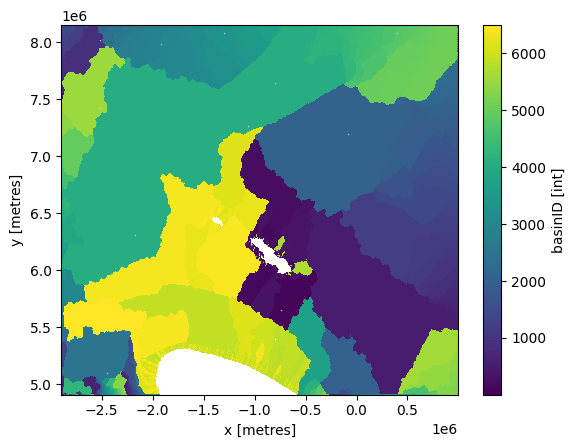

In [328]:
test = ds.basinID.where(ds.basinID >= 1)

test.plot()

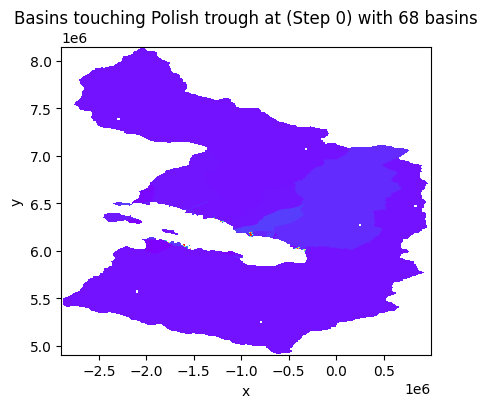

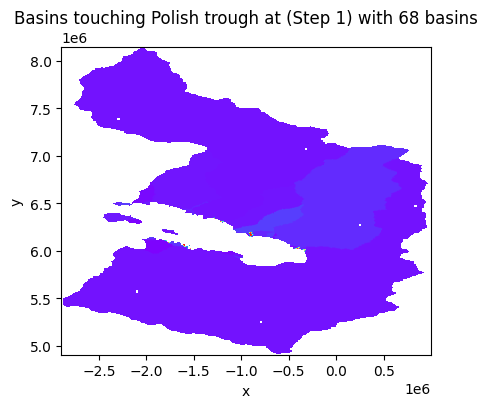

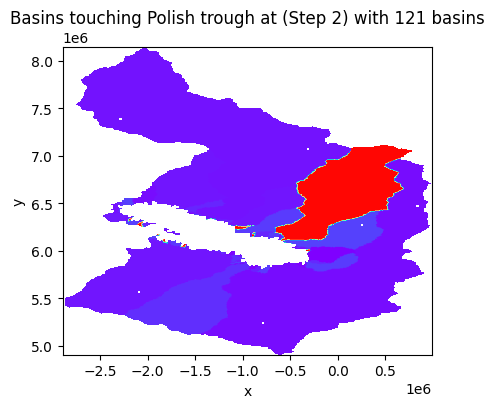

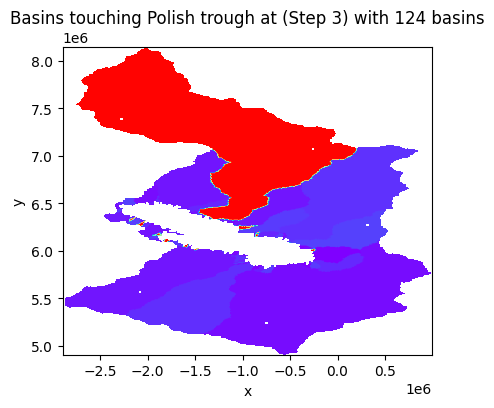

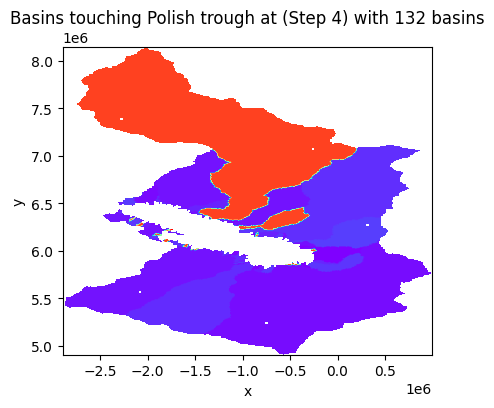

...

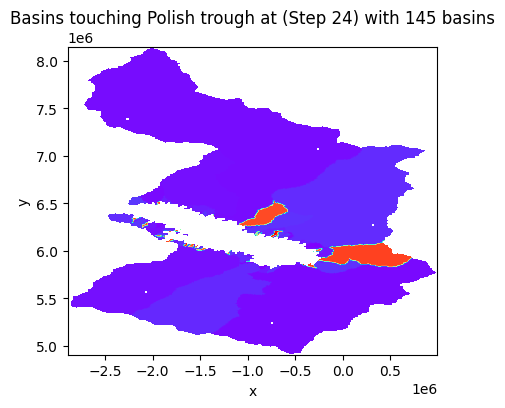

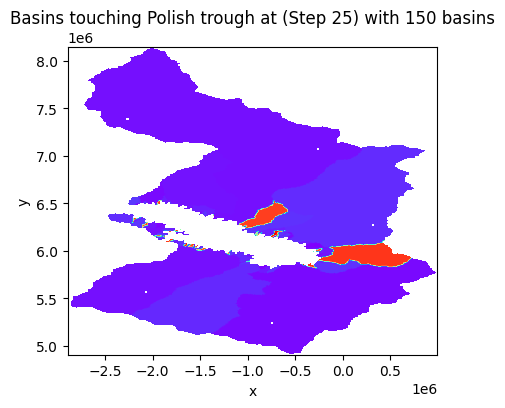

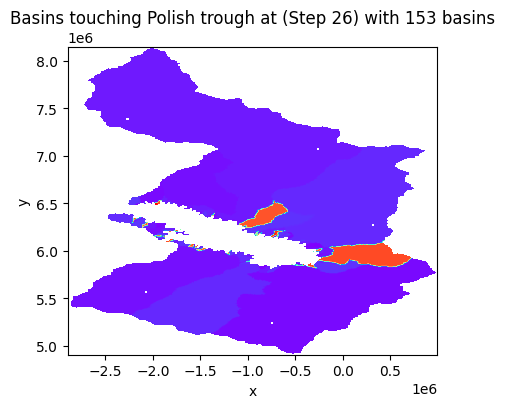

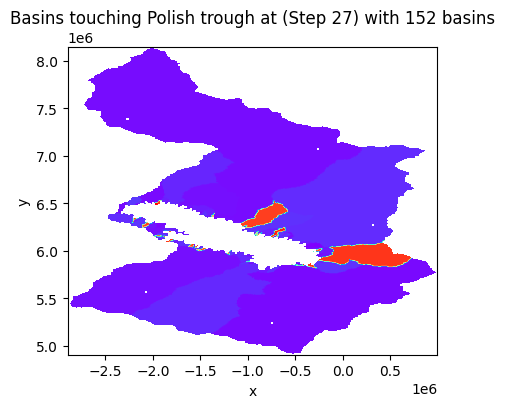

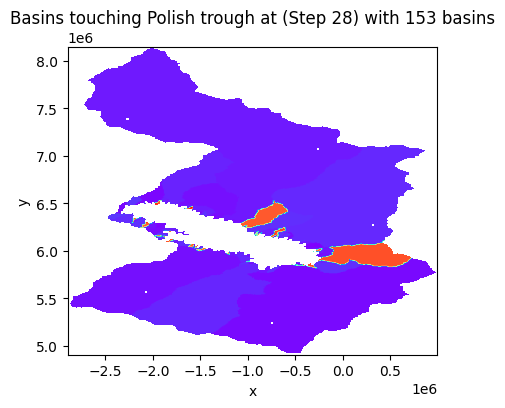

In [329]:
for step in range(0, 29):
    # Load CSV file into pandas DataFrame
    df_en = pd.read_csv(out_path+f'selected_positive_basins_sorted_{step}.csv')
    
    # Load the corresponding NetCDF file
    merged_nc = model_data+'dataN_'+str(step)+'_BsIDnew.nc'
    ds = xr.open_dataset(merged_nc)
    
    
    basin_id = df_en['Basin ID'].values 
    filtered_ds = ds.where(ds['basinID'].isin(basin_id), drop=True)    

   
    plt.figure(figsize=(5, 4))
    plt.imshow(filtered_ds.basinID , cmap='rainbow', extent=[ds.x.min(), ds.x.max(), ds.y.min(), ds.y.max()], origin='lower')
    plt.title(f"Basins touching Polish trough at (Step {step}) with {len(basin_id)} basins")
    plt.xlabel("x")
    plt.ylabel("y")
    # plt.legend()
    


    # Display the plot
    plt.show()

## Find the basinID of the Western German Basin throughout the simulation

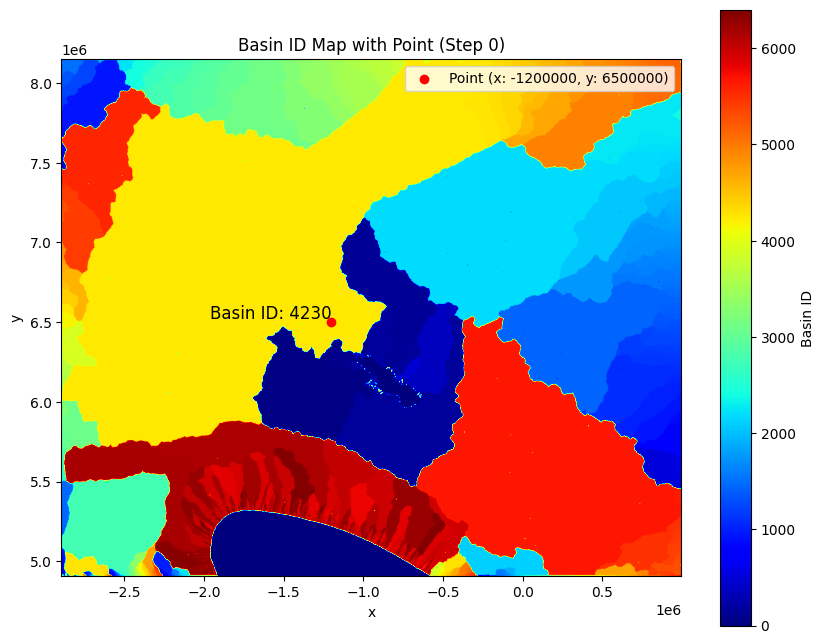

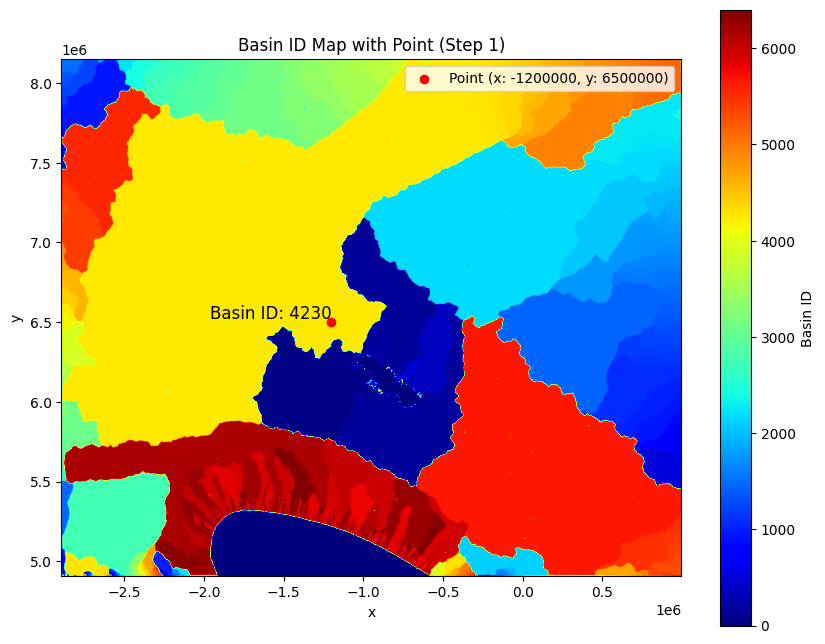

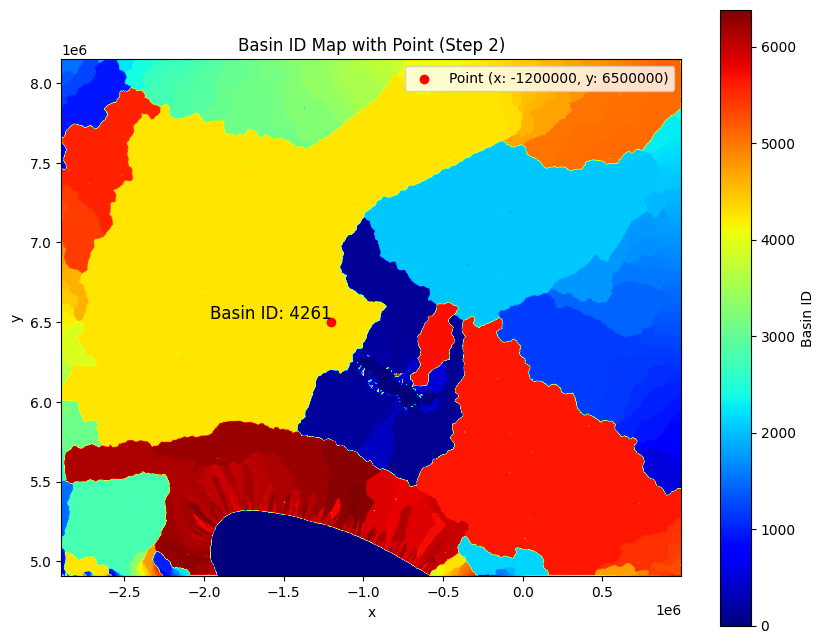

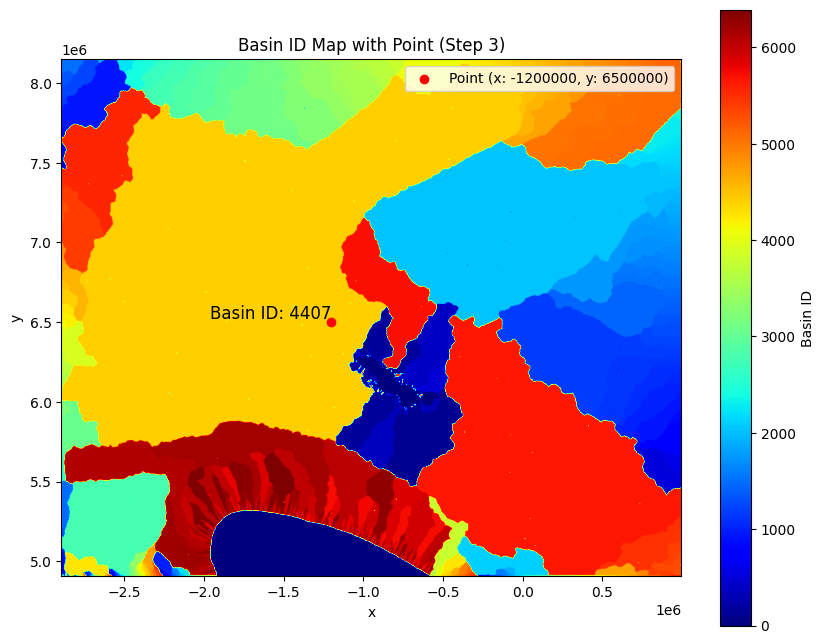

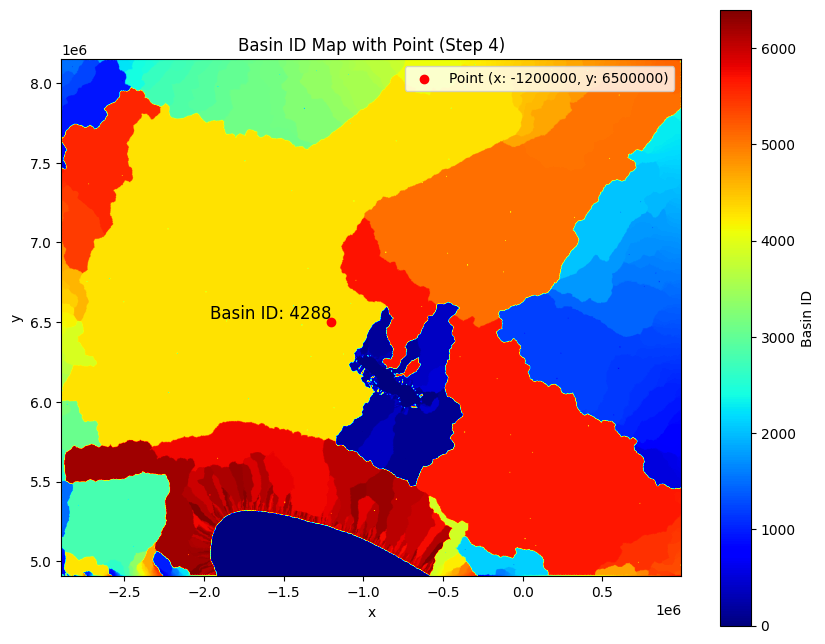

...

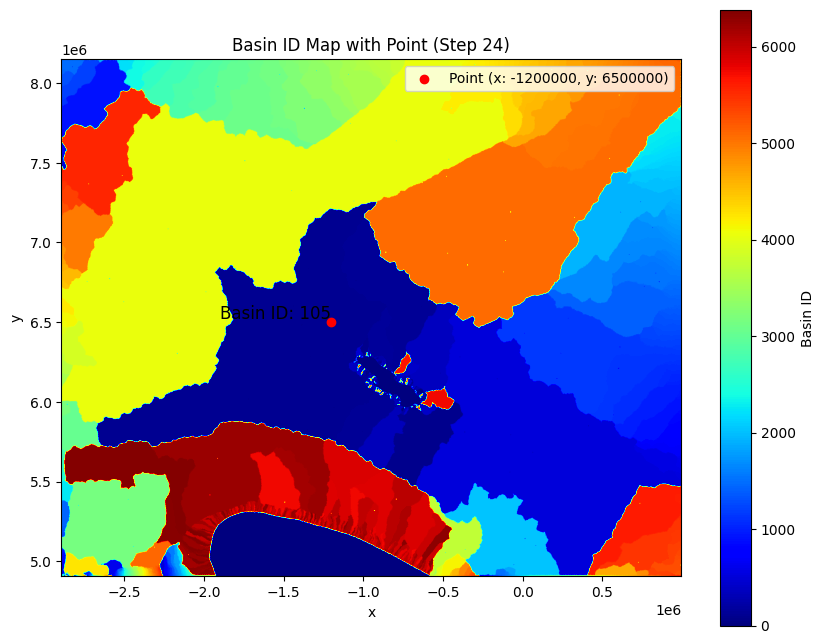

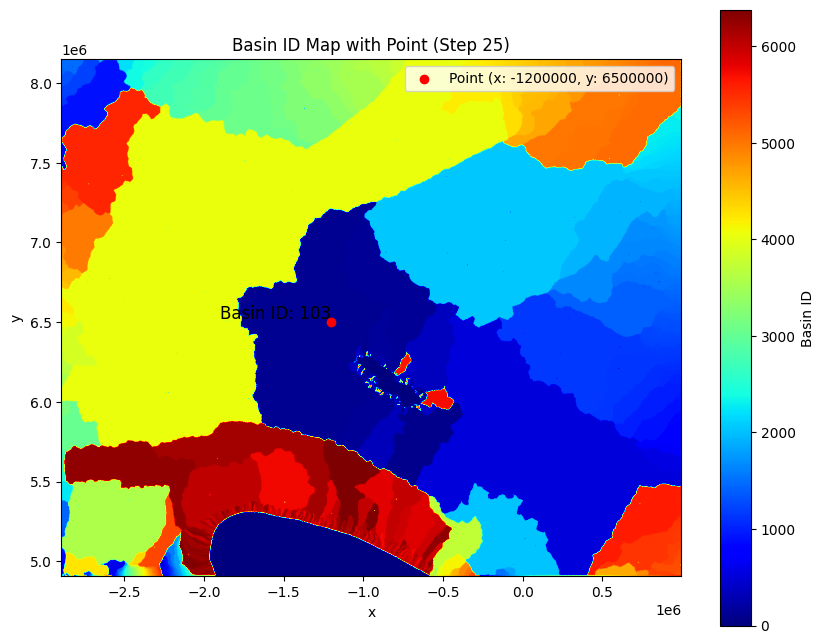

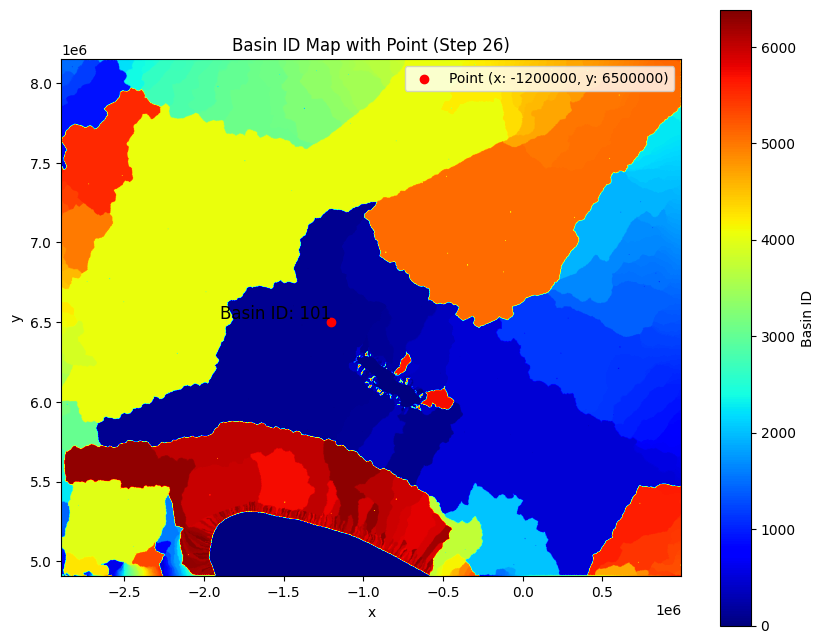

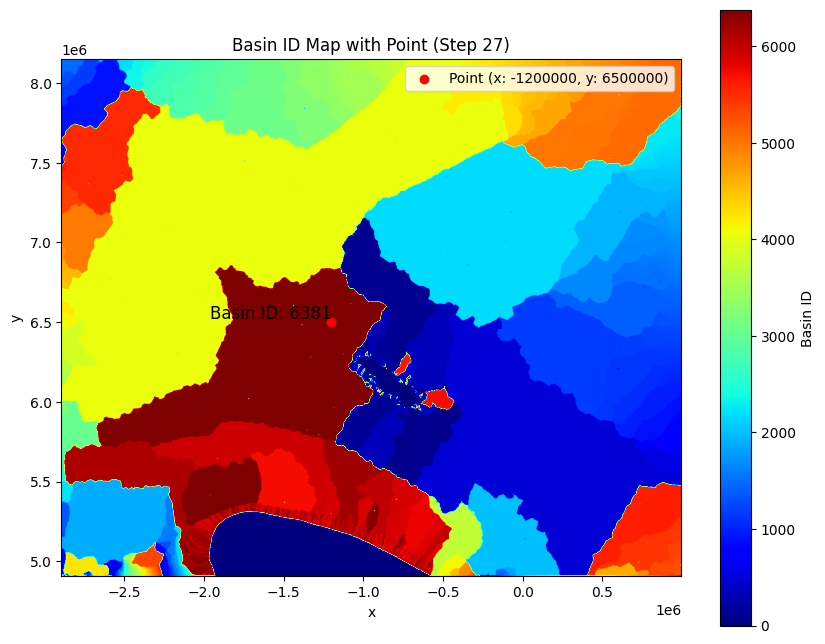

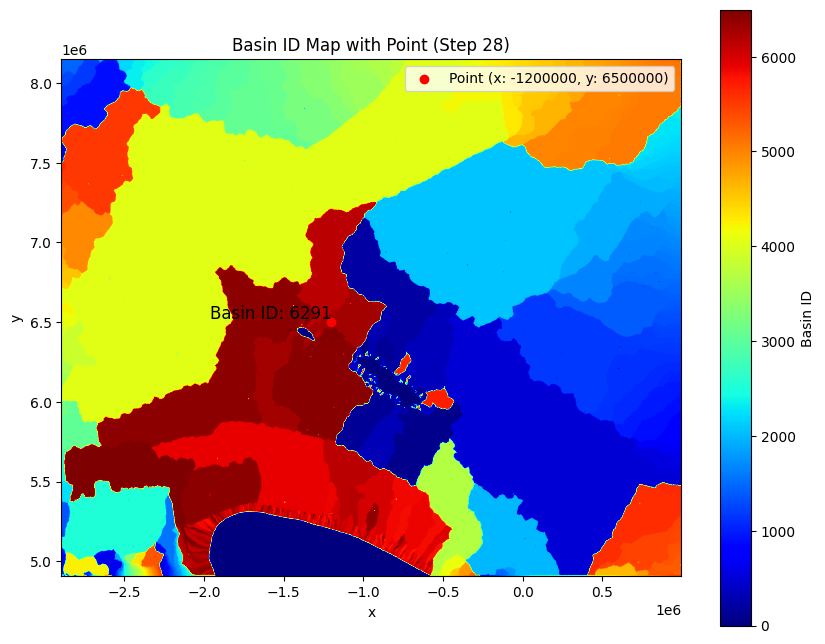

In [330]:
# Test for one point

x_point = -1200000
y_point = 6500000


# Loop through timesteps (from 27 to 5)
WestGermanID = []
for step in range(0, 29):
    # Load netCDF data
    merged_nc =  merged_nc = model_data+'dataN_'+str(step)+'_BsIDnew.nc'
    ds = xr.open_dataset(merged_nc)
    basinID = ds['basinID']
   
    
    # Find the basin ID for the given point using nearest neighbor method
    basin_id = int(basinID.sel(x=x_point, y=y_point, method='nearest').values)
    WestGermanID.append(basin_id)
    
    # Plot the basin ID map for each step
    plt.figure(figsize=(10, 8))
    plt.imshow(basinID, cmap='jet', extent=[ds.x.min(), ds.x.max(), ds.y.min(), ds.y.max()], origin='lower')
    plt.colorbar(label='Basin ID')
    plt.scatter(x_point, y_point, color='red', marker='o', label=f'Point (x: {x_point}, y: {y_point})')
    plt.text(x_point, y_point, f'Basin ID: {basin_id}', fontsize=12, color='black', ha='right', va='bottom')
    plt.xlabel('x')
    plt.ylabel('y')
    plt.title(f'Basin ID Map with Point (Step {step})')
    plt.legend()
    plt.show()

In [331]:
times = np.arange(0, 29, 1)

# Create a CSV file
with open(out_path+'west_german_basin.csv', 'w', newline='') as csvfile:
    csvwriter = csv.writer(csvfile)
    # Write the header
    csvwriter.writerow(['Step', 'WestGermanBasinID'])
    # Write the data
    for time, basin_id in zip(times, WestGermanID):
        csvwriter.writerow([time, f"{basin_id}.0"])

print("CSV file 'west_german_basin.csv' created successfully.")

CSV file 'west_german_basin.csv' created successfully.


In [332]:
# Function to read CSV file and return rows as a list
def read_csv(file_path):
    with open(file_path, 'r') as csvfile:
        csvreader = csv.reader(csvfile)
        header = next(csvreader)  # Skip the header
        rows = list(csvreader)  # Read all rows
    return rows

# Read all rows from west_german_basin.csv

west_german_rows = read_csv(out_path + 'west_german_basin.csv')

# Loop through all 28 CSV files and check if each corresponding row in west_german_basin.csv is present in each file
for step in range(0, 29):
    file_name = out_path+f'selected_positive_basins_sorted_{step}.csv'
    if os.path.exists(file_name):
        step_rows = read_csv(file_name)
        basin_ids = [row[0] for row in step_rows]  # Extract the first column (Basin ID)
        row = west_german_rows[step]  # Get the corresponding row from west_german_basin.csv
        if row[1] in basin_ids:  # Check if the Basin ID from west_german_basin.csv is in the first column of step file
            print(f"Basin ID {row[1]} from west_german_basin.csv is present in {file_name}.")
        else:
            print("{step}")
            # print(f"Basin ID {row[1]} from west_german_basin.csv is NOT present in {file_name}.")
    else:
        print(f"File {file_name} does not exist.")

{step}
{step}
{step}
{step}
{step}
{step}
{step}
{step}
{step}
{step}
{step}
{step}
{step}
{step}
{step}
{step}
{step}
{step}
{step}
{step}
{step}
{step}
{step}
{step}
{step}
{step}
{step}
{step}
{step}


In [333]:
# Function to read CSV file and return header and rows as a list
def read_csv(file_path):
    with open(file_path, 'r') as csvfile:
        csvreader = csv.reader(csvfile)
        header = next(csvreader)  # Skip the header
        rows = list(csvreader)  # Read all rows
    return header, rows

# Function to write rows to a CSV file
def write_csv(file_path, header, rows):
    with open(file_path, 'w', newline='') as csvfile:
        csvwriter = csv.writer(csvfile)
        csvwriter.writerow(header)  # Write the header
        csvwriter.writerows(rows)  # Write the rows

# Read all rows from west_german_basin.csv
header_west_german, west_german_rows = read_csv(out_path + 'west_german_basin.csv')

# Loop through all 28 CSV files and check if each corresponding row in west_german_basin.csv is present in each file
for step in range(0, 29):
    file_name = out_path+f'selected_positive_basins_sorted_{step}.csv'
    new_file_name = out_path+f'updated_selected_positive_basins_sorted_{step}.csv'
    if os.path.exists(file_name):
        header_step, step_rows = read_csv(file_name)
        basin_ids = [row[0] for row in step_rows]  # Extract the first column (Basin ID)
        row = west_german_rows[step - 1]  # Get the corresponding row from west_german_basin.csv
        if row[1] in basin_ids:  # Check if the Basin ID from west_german_basin.csv is in the first column of step file
            print(f"Basin ID {row[1]} from west_german_basin.csv is present in {file_name}. Deleting it.")
            # Remove the row with the matching Basin ID
            step_rows = [r for r in step_rows if r[0] != row[1]]
        else:
            print(f"Basin ID {row[1]} from west_german_basin.csv is NOT present in {file_name}.")
        # Write the updated rows to a new CSV file
        write_csv(new_file_name, header_step, step_rows)
    else:
        print(f"File {file_name} does not exist.")


Basin ID 6291.0 from west_german_basin.csv is NOT present in model7_NewSubK3_v2/selected_positive_basins_sorted_0.csv.
Basin ID 4230.0 from west_german_basin.csv is NOT present in model7_NewSubK3_v2/selected_positive_basins_sorted_1.csv.
Basin ID 4230.0 from west_german_basin.csv is NOT present in model7_NewSubK3_v2/selected_positive_basins_sorted_2.csv.
Basin ID 4261.0 from west_german_basin.csv is NOT present in model7_NewSubK3_v2/selected_positive_basins_sorted_3.csv.
Basin ID 4407.0 from west_german_basin.csv is NOT present in model7_NewSubK3_v2/selected_positive_basins_sorted_4.csv.
Basin ID 4288.0 from west_german_basin.csv is NOT present in model7_NewSubK3_v2/selected_positive_basins_sorted_5.csv.
Basin ID 4215.0 from west_german_basin.csv is NOT present in model7_NewSubK3_v2/selected_positive_basins_sorted_6.csv.
Basin ID 4335.0 from west_german_basin.csv is NOT present in model7_NewSubK3_v2/selected_positive_basins_sorted_7.csv.
Basin ID 4135.0 from west_german_basin.csv is NO

### Plot to check that the Western German Basin has been removed

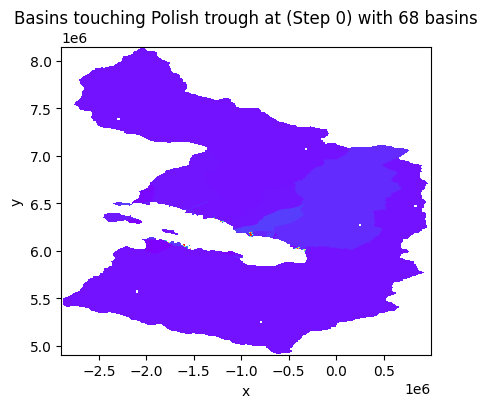

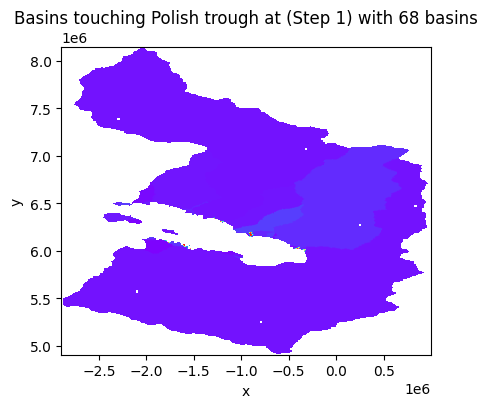

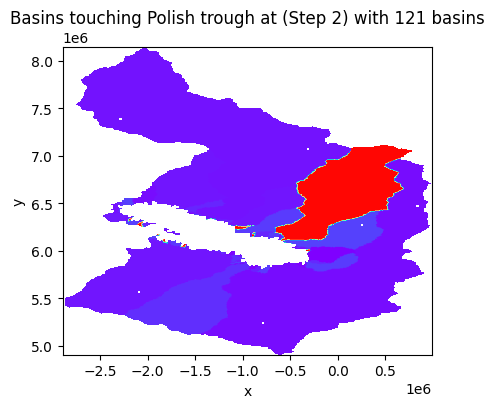

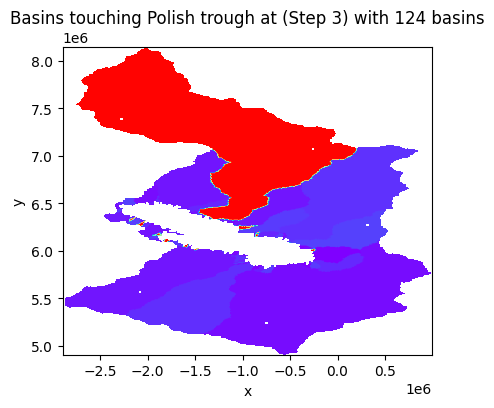

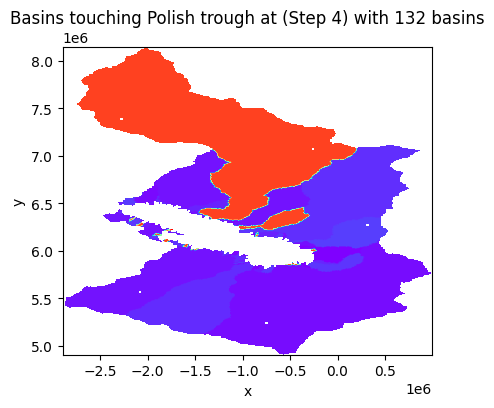

...

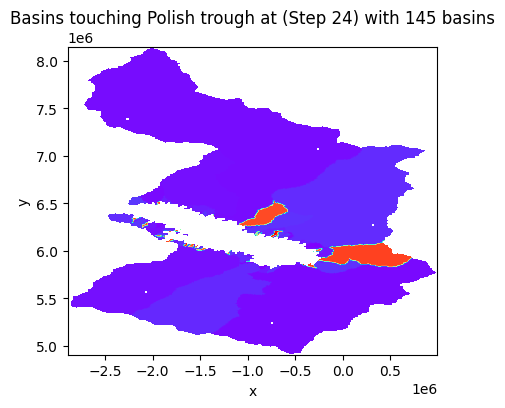

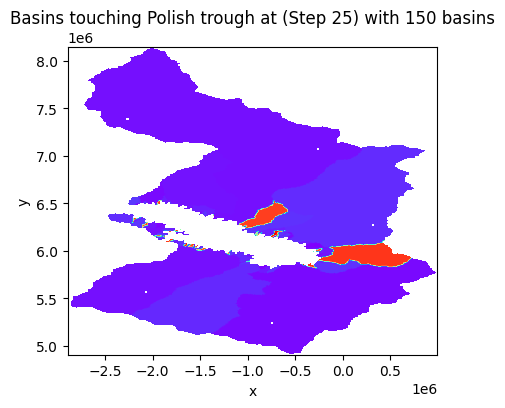

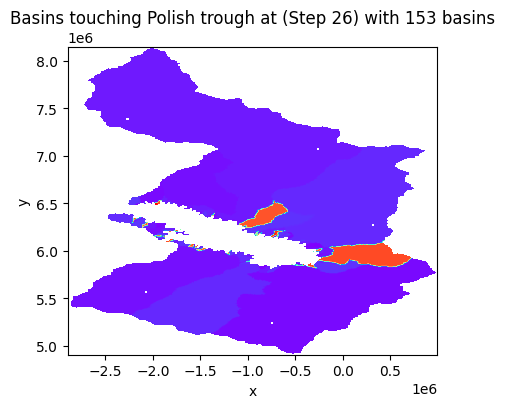

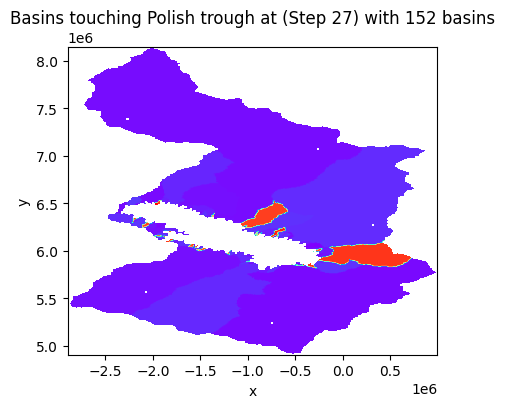

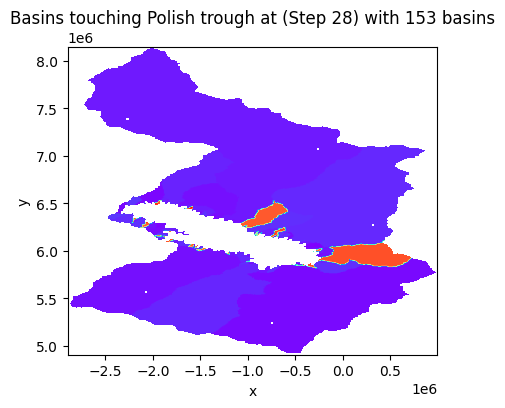

In [334]:
for step in range(0, 29):
    # Load CSV file into pandas DataFrame
    df_en = pd.read_csv(out_path+f'updated_selected_positive_basins_sorted_{step}.csv')
    
    # Load the corresponding NetCDF file
    merged_nc = model_data+f"dataN_{step}_BsIDnew.nc"
    ds = xr.open_dataset(merged_nc)
    
    basin_id = df_en['Basin ID'].values 
    filtered_ds = ds.where(ds['basinID'].isin(basin_id), drop=True)    

   
    plt.figure(figsize=(5, 4))
    plt.imshow(filtered_ds.basinID , cmap='rainbow', extent=[ds.x.min(), ds.x.max(), ds.y.min(), ds.y.max()], origin='lower')
    plt.title(f"Basins touching Polish trough at (Step {step}) with {len(basin_id)} basins")
    plt.xlabel("x")
    plt.ylabel("y")
    # plt.legend()
     # Save the map as PNG
    output_filename = out_path+ f'BasinSelection_{step}.png'
    plt.savefig(output_filename, dpi=200)  
    


    # Display the plot
    plt.show()

In [336]:
basinEro = []
basinDepo = []

for step in range(1,29):
        
    # Open grids
    ds_old = xr.open_dataset(model_data+'/dataN_'+str(step-1)+'_BsIDnew.nc')
    ds_now = xr.open_dataset(model_data+'/dataN_'+str(step)+'_BsIDnew.nc')
    
    
    # Make sure the Polish basin is different from the ocean and the German Basin (setting its basin id to -2)
    newbaID = ds_now.basinID.where((ds_now.x>-1.1e6)&(ds_now.x<-0.5e6)&(ds_now.y>5.8e6)
                                       &(ds_now.y<6.5e6)&(ds_now.basinID<1) & (ds_now.newelev < -9000))   
    # Find the maximum basinID in the dataset
    max_basinID = ds_now.basinID.max().item()
    # Assign a new unique basinID to isolate the Polish Basin
    new_unique_basinID = max_basinID + 1
    ds_now['basinID'] = ds_now.basinID.where(~((ds_now.x > -1.1e6) & (ds_now.x < -0.5e6) & (ds_now.y > 5.8e6) 
                                       & (ds_now.y < 6.5e6) & (ds_now.basinID < 1) & (ds_now.newelev < -9000)), new_unique_basinID)
    
    
    
    # ds_now['basinID'] = ds_now.basinID.where(newbaID>0,-2)
    dx = ds_now.x.values[1]-ds_now.x.values[0]
    dx2 = dx**2
    
    basinF = basin_data+'updated_selected_positive_basins_sorted_'+str(step)+'.csv'
    basinIDs = pd.read_csv(basinF)
        
    # Compute basin erosion & deposition
    basin_dep = ds_now.erodep.where((ds_now.basinID == new_unique_basinID))#&(ds_now.erodep>0))
    basin_ero = ds_now.erodep.where((ds_now.basinID == new_unique_basinID)&(ds_now.erodep<0))
    
    depBasin_vol = (basin_dep*dx2).sum().values*1.e-9 
    eroBasin_vol = (basin_ero*dx2).sum().values*1.e-9 
    
    basinDepo.append(depBasin_vol)
    basinEro.append(eroBasin_vol)
    
    # print('Eroded Polish Trough step '+str(step)+': '+ str(round(eroBasin_vol,2)) +' km3')
    print('Deposited Polish Trough step '+str(step)+': '+ str(round(depBasin_vol,2)) +' km3')
    
    # Extract information from upstream regions
    bID = []
    catch_evol = []
    
    ds_diff = (ds_now - ds_old)
    
    for i in range(0,len(basinIDs)):
       
        catchment = basinIDs['Basin ID'][i] 
        ds_catch = ds_diff.where(ds_now.basinID == catchment)
    
        # Find points with the catchment that are eroded
        catch_ero = ds_catch.where((ds_catch.erodep<0))
        # Find the volume of sediment in the catchment:
        catch_ero = -(catch_ero.erodep*dx2).sum().values.item()
        
        bID.append(int(catchment))
        catch_evol.append(catch_ero*1.e-9)
    
    basinID_Vals = pd.DataFrame({'BasinID': bID,
                'volEro': catch_evol,})
    
    upstream_ero = np.sum(np.asarray(catch_evol))
    print('Eroded upstream Polish Trough step '+str(step)+': '+ str(round(upstream_ero,2)) +' km3')
    basinID_Vals.to_csv(outfolder+'/sed_catchment_'+str(step)+'.csv',index=False)

# Save Polish info
polishDF = pd.DataFrame({
            'ero_vol_km3': basinEro,
            'depo_vol_km3': basinDepo})
dd = np.asarray(basinDepo)
dd[1:] = dd[1:]-dd[:-1]
polishDF['depo_vol_stp'] = dd

ee = np.asarray(basinEro)
ee[1:] = ee[1:]-ee[:-1] 
polishDF['ero_vol_stp'] = ee

polishDF.to_csv(outfolder+'/polish_dep_ero_vol.csv',index=False)

Deposited Polish Trough step 1: 672.8 km3
Eroded upstream Polish Trough step 1: 766.54 km3
Deposited Polish Trough step 2: 1238.94 km3
Eroded upstream Polish Trough step 2: 769.95 km3
Deposited Polish Trough step 3: 1870.11 km3
Eroded upstream Polish Trough step 3: 747.76 km3
Deposited Polish Trough step 4: 2528.31 km3
Eroded upstream Polish Trough step 4: 756.61 km3
Deposited Polish Trough step 5: 3192.88 km3
Eroded upstream Polish Trough step 5: 767.88 km3
Deposited Polish Trough step 6: 3851.32 km3
Eroded upstream Polish Trough step 6: 780.13 km3
Deposited Polish Trough step 7: 4492.58 km3
Eroded upstream Polish Trough step 7: 792.63 km3
Deposited Polish Trough step 8: 5109.32 km3
Eroded upstream Polish Trough step 8: 805.23 km3
Deposited Polish Trough step 9: 5683.99 km3
Eroded upstream Polish Trough step 9: 818.88 km3
Deposited Polish Trough step 10: 6248.13 km3
Eroded upstream Polish Trough step 10: 641.51 km3
Deposited Polish Trough step 11: 6745.96 km3
Eroded upstream Polish Tr

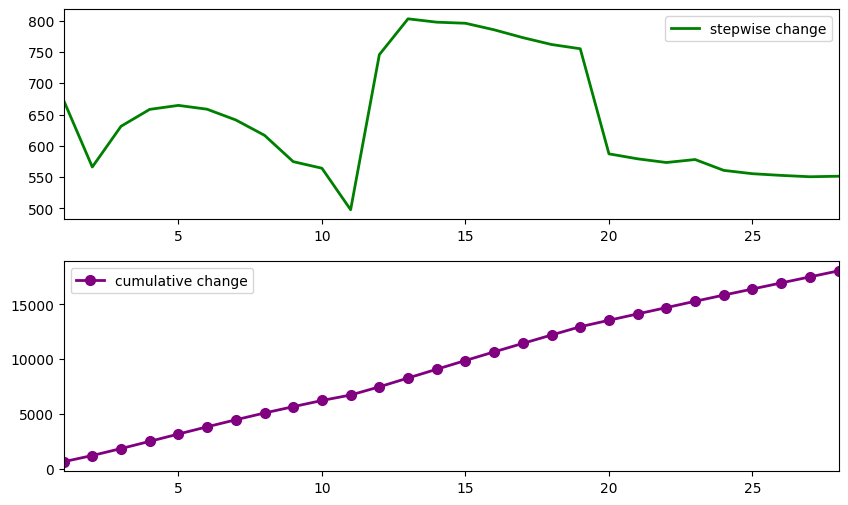

In [337]:
# Load the data
polishDF = pd.read_csv(outfolder + '/polish_dep_ero_vol.csv')

nstep = np.arange(len(polishDF)) + 1
ero_step = polishDF['ero_vol_stp'].values
ero_cum = polishDF['ero_vol_km3'].values
depo_step = polishDF['depo_vol_stp'].values
depo_cum = polishDF['depo_vol_km3'].values

# Create a figure with two subplots
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(10, 6))

# Plot the first subplot
ax1.plot(nstep, depo_step, label="stepwise change", lw=2, color='green')
ax1.set_xlim(1, 28)
ax1.legend()

# Plot the second subplot
ax2.plot(nstep, depo_cum, label="cumulative change", lw=2, marker='o', markersize=7, color='purple')
ax2.set_xlim(1, 28)
ax2.legend()

# Save the figure to a file
plt.savefig(outfolder +'Volumes.png')

# Show the plot (optional)
plt.show()

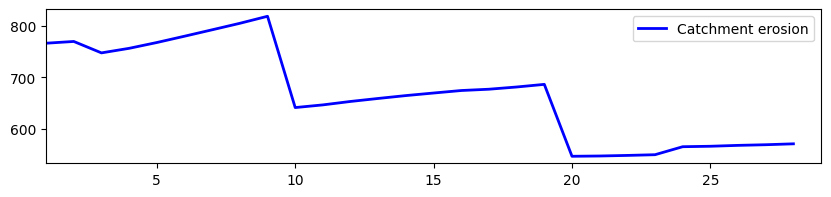

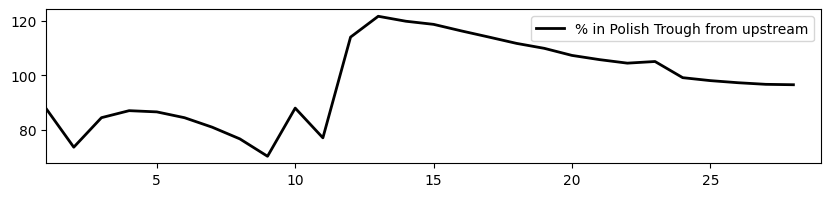

In [338]:
totero_catchment = []
for k in range(1,29):
    basinID_Vals = pd.read_csv(outfolder+'/sed_catchment_'+str(k)+'.csv')
    tmp = np.sum(basinID_Vals['volEro'].values)
    totero_catchment.append(tmp)

plt.figure(figsize = (10,2))
plt.plot(nstep, totero_catchment, label = "Catchment erosion", lw = '2', color = 'blue')
plt.xlim(1,29)
# plt.yscale("log")
plt.legend()
plt.show()


#We can now extract the proportion of sediment eroded in 
#the upstream catchments of the Polish Trough that are actually stored in the basin

plt.figure(figsize = (10,2))
plt.plot(nstep, (depo_step)*100/totero_catchment, label = "% in Polish Trough from upstream", lw = '2', color = 'black')
plt.xlim(1,29)
plt.legend()
plt.show()

In [339]:
# Open the sources dataset
sources = xr.open_dataset('ProvenanceSimple_polygon_clipped_utm_resol.nc')
unique_src = np.unique(sources.sources.values[:,:-1].astype(int))
tot_ero = []
e_vol_source = []

for step in range(1, 29):
    ds_old = xr.open_dataset(model_data + '/dataN_' + str(step-1) + '_BsIDnew.nc')
    ds_now = xr.open_dataset(model_data + '/dataN_' + str(step) + '_BsIDnew.nc')
    ds_diff = ds_now - ds_old

    basinF = basin_data + '/updated_selected_positive_basins_sorted_' + str(step) + '.csv'
    basinIDs = pd.read_csv(basinF)
    tmpv = np.zeros(ds_now.erodep.values.shape)
    for i in range(len(basinIDs)):
        catchment = basinIDs['Basin ID'][i]
        ds_catch = ds_now.where(ds_now.basinID == catchment, 0)
        tmp = ds_catch.basinID.values
        tmp[tmp == catchment] = 1
        tmpv += tmp
    ds_now['combine_basins'] = (['y', 'x'], tmpv)

    ero_tot = ds_diff.where(ds_diff.erodep < 0)
    ero_tot = ero_tot.where(ds_now['combine_basins'] == 1)

    # Ensure sources array matches the dimensions of ero_tot
    pad_y = max(0, ero_tot.sizes['y'] - sources.sizes['y'])
    pad_x = max(0, ero_tot.sizes['x'] - sources.sizes['x'])
    sources_padded = np.pad(sources.sources.values[:, :-1], 
                            ((0, pad_y), (0, pad_x)), 
                            mode='constant', constant_values=0)
    sources_trimmed = sources_padded[:ero_tot.sizes['y'], :ero_tot.sizes['x']]

    # Create a DataArray for sources_trimmed
    sources_da = xr.DataArray(sources_trimmed, dims=['y', 'x'], coords={'y': ero_tot.coords['y'], 'x': ero_tot.coords['x'][:sources_trimmed.shape[1]]})
    ero_tot['sources'] = sources_da

    sum_erosion = 0
    e_vol = []
    for k in range(len(unique_src)):
        src = unique_src[k]
        ero_vol = -(ero_tot.where(ero_tot.sources == src).erodep * dx2).sum().item()
        sum_erosion += ero_vol
        e_vol.append(ero_vol)

    e_vol_source.append(e_vol)

    perc = np.asarray(e_vol) * 100 / sum_erosion
    tot_ero.append(sum_erosion)
    poly_Vals = pd.DataFrame({
        'ero_vol': e_vol,
        'ero_perc': perc,
    })
    print(step)
    poly_Vals.to_csv(outfolder + '/ProvClaire_upstream_ero_vol' + str(step) + '.csv', index=False)

poly_Tot = pd.DataFrame({
    'step': np.arange(1, 29),
    'tot_ero': tot_ero,
})
poly_Tot.to_csv(outfolder + '/ProvClaire_upstream_ero_vol.csv', index=False)


1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28


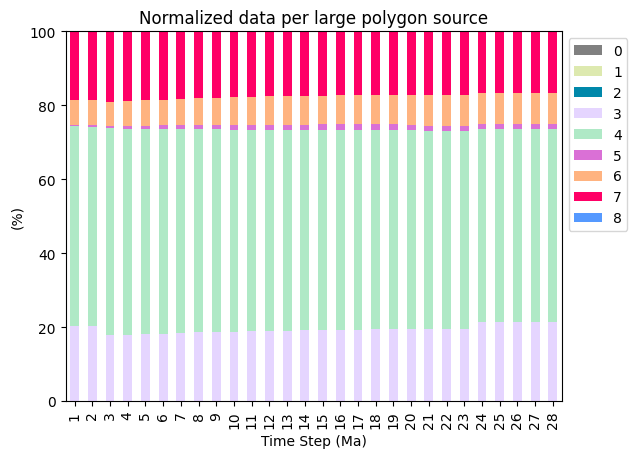

In [340]:
prop = []

for step in range(1,29):
    poly_Vals = pd.read_csv(outfolder+'/ProvClaire_upstream_ero_vol'+str(step)+'.csv')
    prop.append(poly_Vals['ero_perc'])
    

perc_poly = pd.DataFrame({"1":prop[0]})
for k in range(1,29):
   perc_poly[str(k)] = prop[k-1]
# Define custom colors
colors = ['gray','#dde9afff',  '#0088aaff', '#e5d5ffff', '#afe9c6ff', '#da70d6ff', '#ffb380ff', '#ff0066ff', '#5599ffff']


ax = plt.subplot() 
perc_poly.T.plot(kind='bar', stacked=True,ax=ax, color=colors);
plt.xlabel('Time Step (Ma)')
plt.ylabel('(%)')
plt.ylim(0,100)
plt.legend(bbox_to_anchor=(1, 1), loc='upper left')
plt.title('Normalized data per large polygon source')

# Save the plot as an SVG file
plt.savefig(outfolder+'Tecto_Normalized_data.svg', format='svg')
plt.savefig(outfolder+'Tecto_Normalized_data.png', format='png')



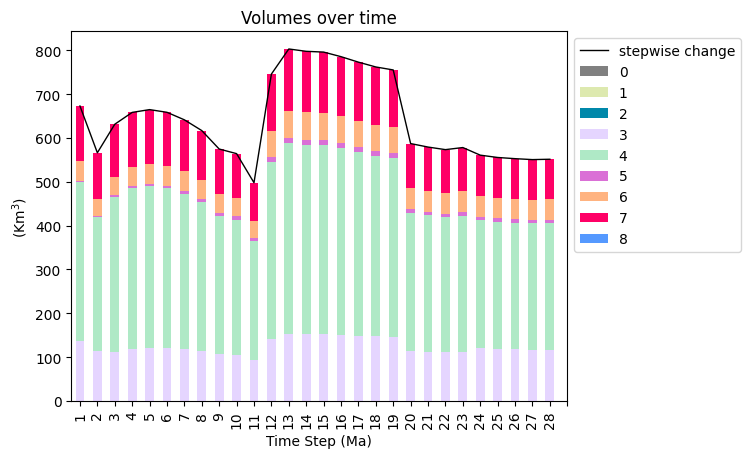

In [341]:
vol_per = perc_poly*1.e-2*depo_step

vol_per.T.plot(kind = 'bar', stacked = True, color = colors)



plt.plot(nstep-1, depo_step, label = "stepwise change", lw = '1', color = 'black')
plt.xlabel('Time Step (Ma)')
plt.ylabel('(Km$^3$)')
plt.title('Volumes over time')
plt.xticks(np.arange(0, 29))
# plt.ylim(0,1)
# plt.yscale("log")
plt.legend(bbox_to_anchor=(1, 1), loc='upper left')
plt.grid(False)
plt.savefig(outfolder+'Volume_sed_time.svg', format='svg')
plt.savefig(outfolder+'Volume_sed_time.png', format='png')

plt.show()



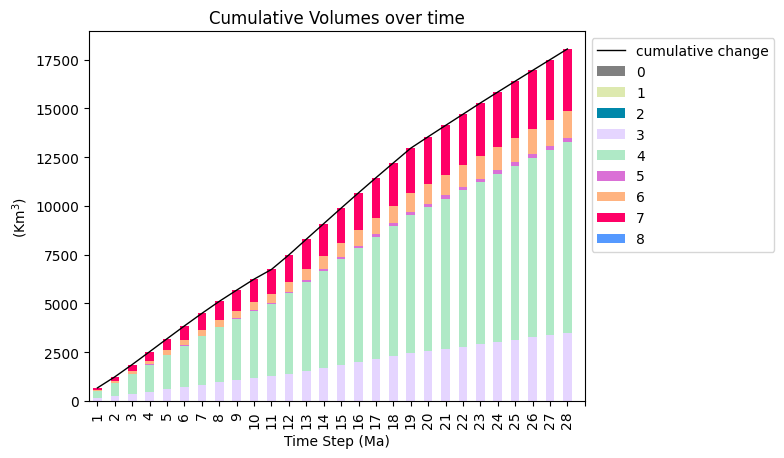

In [342]:
vol_per2 = (vol_per.T)
vol_cum = vol_per2.cumsum(axis = 0)
vol_cum.plot(kind = 'bar', stacked = True, color = colors)



plt.plot(nstep-1, depo_cum, label = "cumulative change", lw = '1', color = 'black')
plt.xlabel('Time Step (Ma)')
plt.ylabel('(Km$^3$)')
plt.title('Cumulative Volumes over time')
plt.xticks(np.arange(0, 29))
# plt.ylim(0,1)
# plt.yscale("log")
plt.legend(bbox_to_anchor=(1, 1), loc='upper left')
plt.grid(False)
plt.savefig(outfolder+'CumVol_sed_time_M1.svg', format='svg')
plt.savefig(outfolder+'CumVol_sed_time_M1.png', format='png')
# plt.show()



In [343]:
sed_vol1 = []
sed_vol2 = []
sed_vol3 = []
sed_vol4 = []
sed_vol5 = []
sed_vol6 = []
sed_vol7 = []
sed_vol8 = []

for step in range(1,29):
    poly_Vals = pd.read_csv(outfolder+'/ProvClaire_upstream_ero_vol'+str(step)+'.csv')
    sed_vol1.append(poly_Vals['ero_vol'][1] )
    sed_vol2.append(poly_Vals['ero_vol'][2] )
    sed_vol3.append(poly_Vals['ero_vol'][3] )
    sed_vol4.append(poly_Vals['ero_vol'][4] )
    sed_vol5.append(poly_Vals['ero_vol'][5] )
    sed_vol6.append(poly_Vals['ero_vol'][6] )
    sed_vol7.append(poly_Vals['ero_vol'][7] )
    sed_vol8.append(poly_Vals['ero_vol'][8] )

source_sedV = pd.DataFrame({
                    'step': np.arange(1,29),
                    'Source 1': sed_vol1,
                    'Source 2': sed_vol2,
                    'Source 3': sed_vol3,
                    'Source 4': sed_vol4,
                    'Source 5': sed_vol5,
                    'Source 6': sed_vol6,
                    'Source 7': sed_vol7,
                    'Source 8': sed_vol8,
                    })

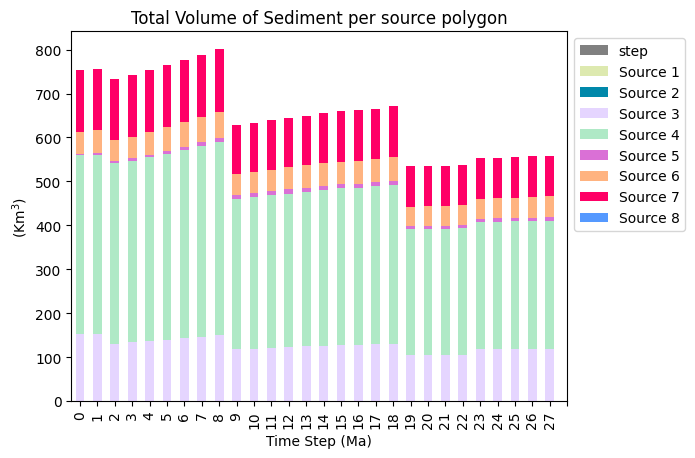

In [344]:
(source_sedV/1.e9).plot(kind = 'bar', stacked = True, color = colors)#, width=0.9)


plt.xlabel('Time Step (Ma)')
plt.ylabel('(Km$^3$)')
plt.title('Total Volume of Sediment per source polygon')
plt.xticks(np.arange(0, 29))

plt.legend(bbox_to_anchor=(1, 1), loc='upper left')
plt.grid(False)

plt.savefig(outfolder+'/TotalVolume_sed_Source.svg', format='svg')
plt.savefig(outfolder+'/TotalVolume_sed_Source_.png', format='png')
plt.show()
